In [1]:
import dask.dataframe as dd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
from matplotlib.lines import Line2D
from matplotlib.legend_handler import HandlerBase

In [2]:
### Define parameters ###
# [version] is the SEVN2 version adopted                            e.g. '3.0.0-Spindevel_RLO'
# [Nsim] is the number of simulations                               e.g. '1mln'
# [Z] is the metallicity of the stars                               e.g. '02' for Z=0.02 solar metallicity
# [SN] is the SN explosion prescription adopted                     e.g. 'del' for delayed or 'com' for compact
# [n] number of cores involved in dask computation                  e.g.  4
# [Hsup] is the threshold for spectroscopic WR                      e.g. '0.3' for WR with H < 0.3 on surface
# [thres_RL] is the threshold for Roche Lobe filling binaries
# [thres_wind] is the threshold for wind fed binaries


Nsim= '1mln'                   # to select a set of simulations
Zlist = ['02','015']
kicklist = ['hobbspure70','hobbspure265','hobbs265','unified265']
SNlist = ['rap','del','com']
ppisn = 'without'
version = '3.0.0-Spindevel_RLO'                                      # select SEVN2 version
n = 4                                                                # cores for dask computation

In [3]:
# set parameters
plt.rcParams.update({'text.usetex': True, 
                     'font.family': 'Helvetica', 
                     'font.size': 35})
path_plots = './plots/'

# Progenitors

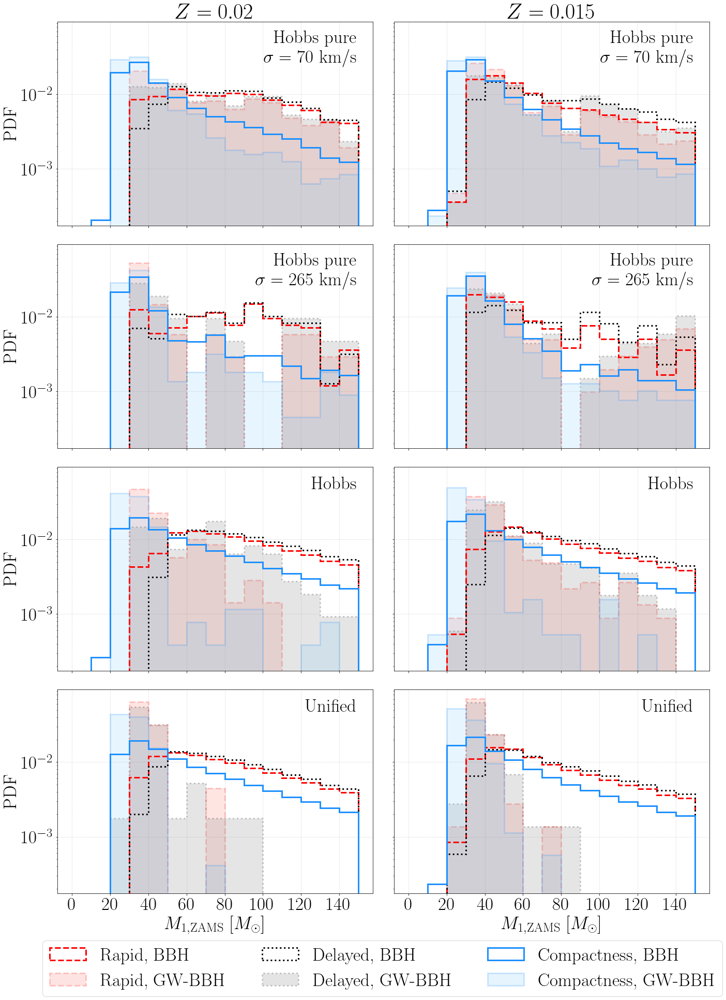

In [6]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,10)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_0'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_0'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,160,20))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm 1, ZAMS}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm 1, ZAMS}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}progM1.pdf')

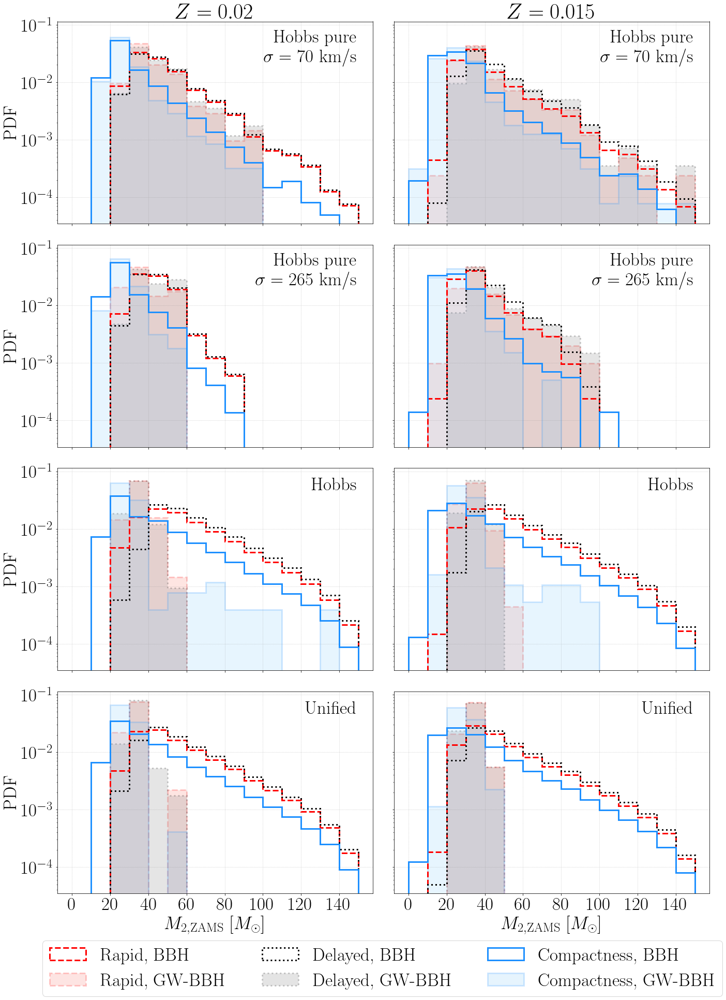

In [7]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,10)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
              
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,160,20))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm 2, ZAMS}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm 2, ZAMS}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}progM2.pdf')

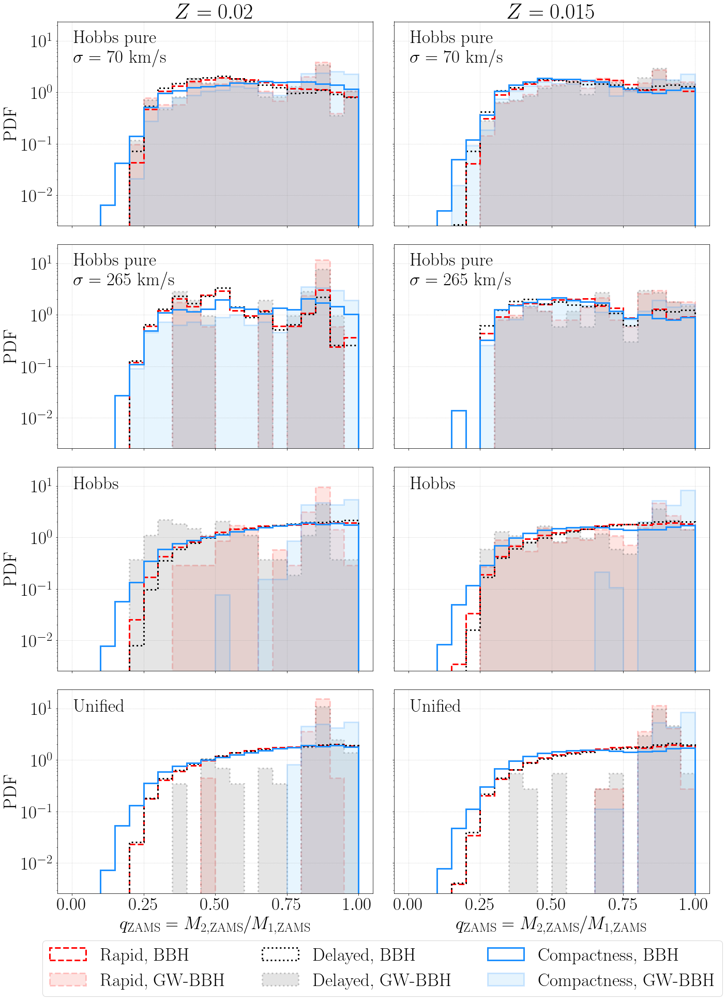

In [8]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.05)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_1']/df['Mass_0'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1']/df1['Mass_0'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].annotate(kicklabel, (0.05,0.8),xycoords='axes fraction', color='k',ha='left')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$q_{\rm ZAMS}=M_{\rm 2, ZAMS}/M_{\rm 1, ZAMS}$')
axs[3][1].set_xlabel(r'$q_{\rm ZAMS}=M_{\rm 2, ZAMS}/M_{\rm 1, ZAMS}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}progq.pdf')

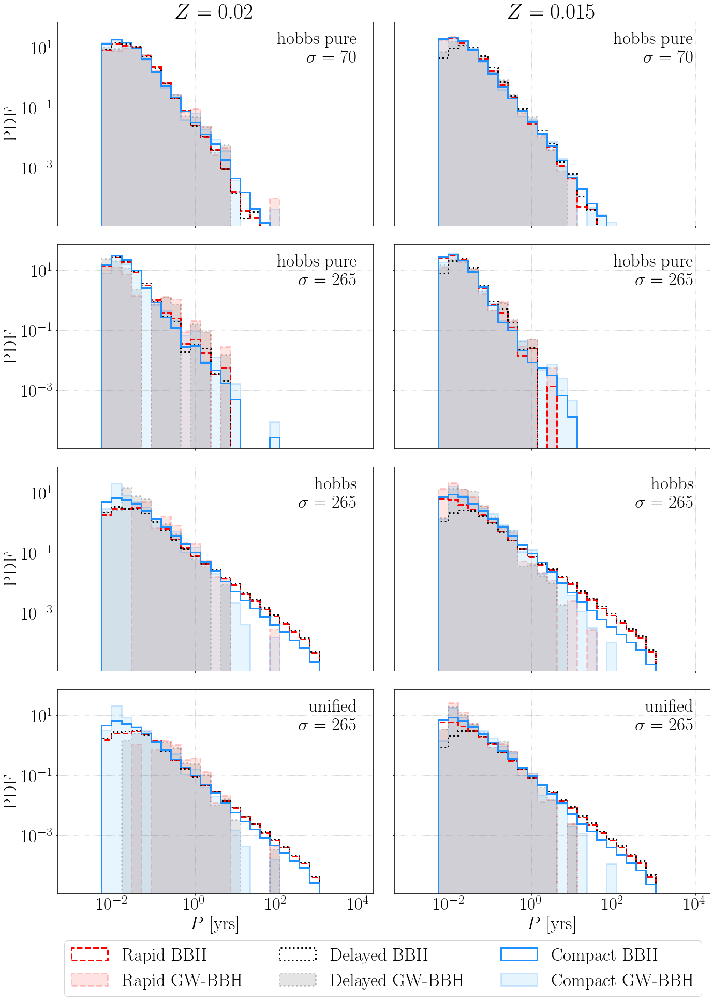

In [83]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),30)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
              
        
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P$ [yrs]')
axs[3][1].set_xlabel(r'$P$ [yrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}progP.pdf')

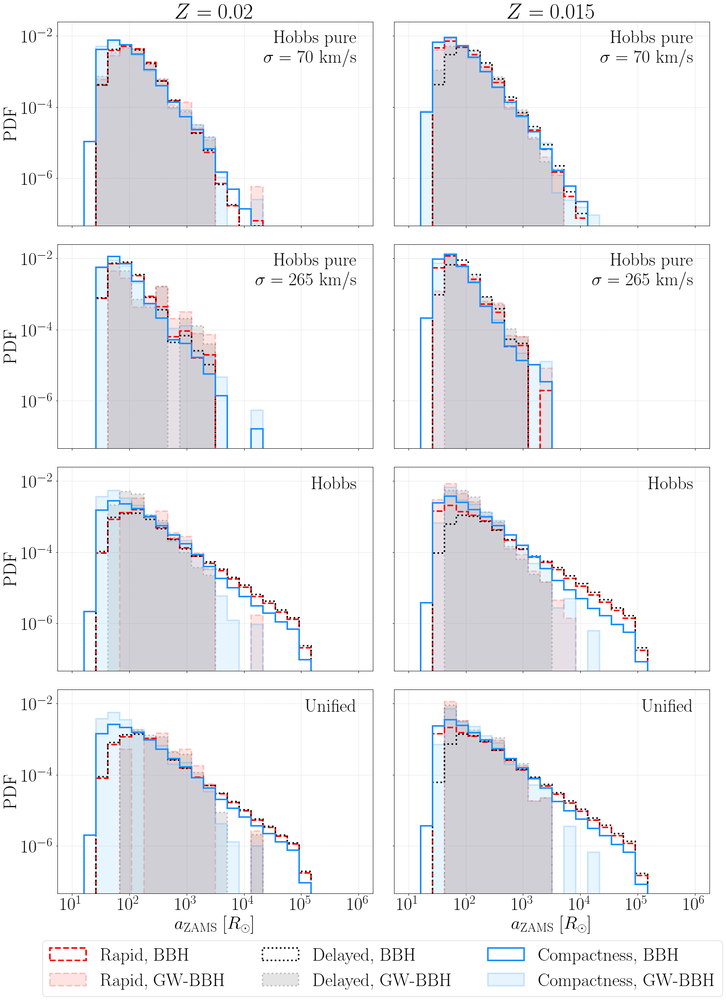

In [11]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(10),np.log10(1e6),25)  # divide into 25 bins
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin

labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['a'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['a'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)          
    
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([10,100,1000,1e4,1e5,1e6]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')

axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a_{\rm ZAMS}$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a_{\rm ZAMS}$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}proga.pdf')

# WR-BH

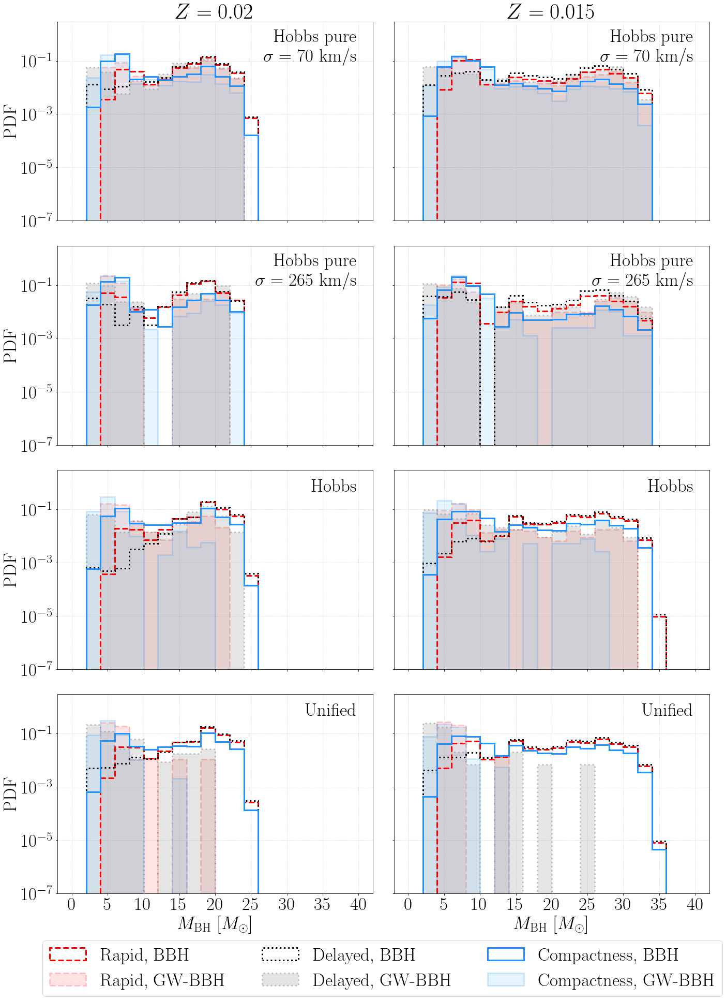

In [19]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,41,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin

labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
lors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            #df2 = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df.loc[df['PhaseBSE_0'] == 14]['Mass_0'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[df1['PhaseBSE_0'] == 14]['Mass_0'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        axs[irow][icol].set_ylim(bottom=1e-7,top=3)
        axs[irow][icol].set_xticks(np.arange(0,41,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm BH}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm BH}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-MBH.pdf')

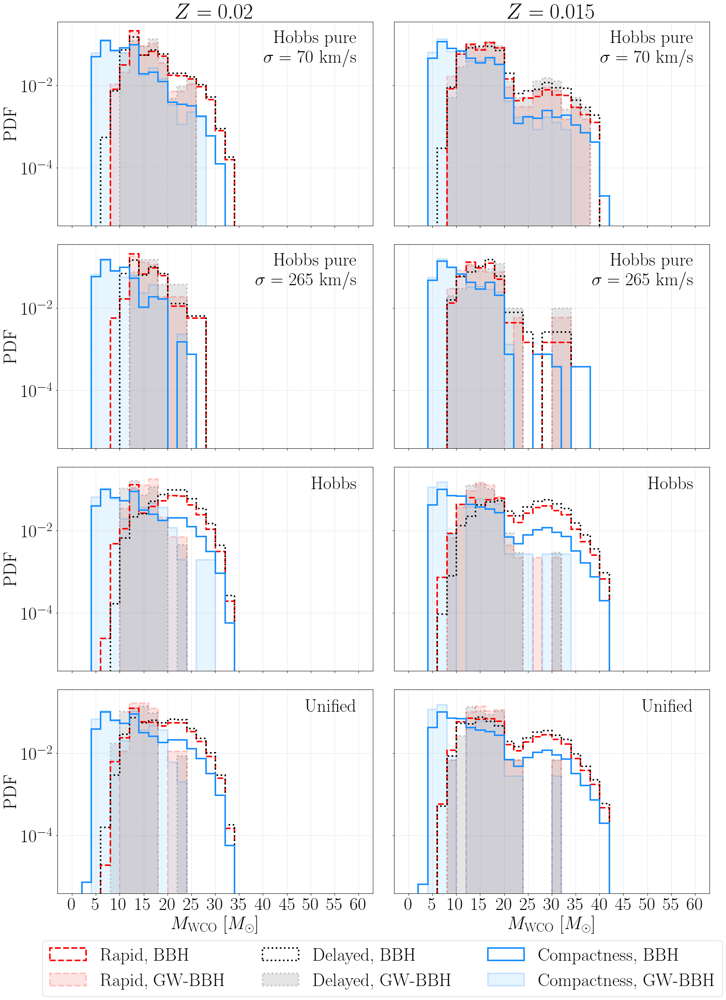

In [20]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] == 0) & (df['PhaseBSE_1'] != 14)]['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] == 0) & (df1['PhaseBSE_1'] != 14)]['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm WCO}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm WCO}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-MWRpureHe.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/hom

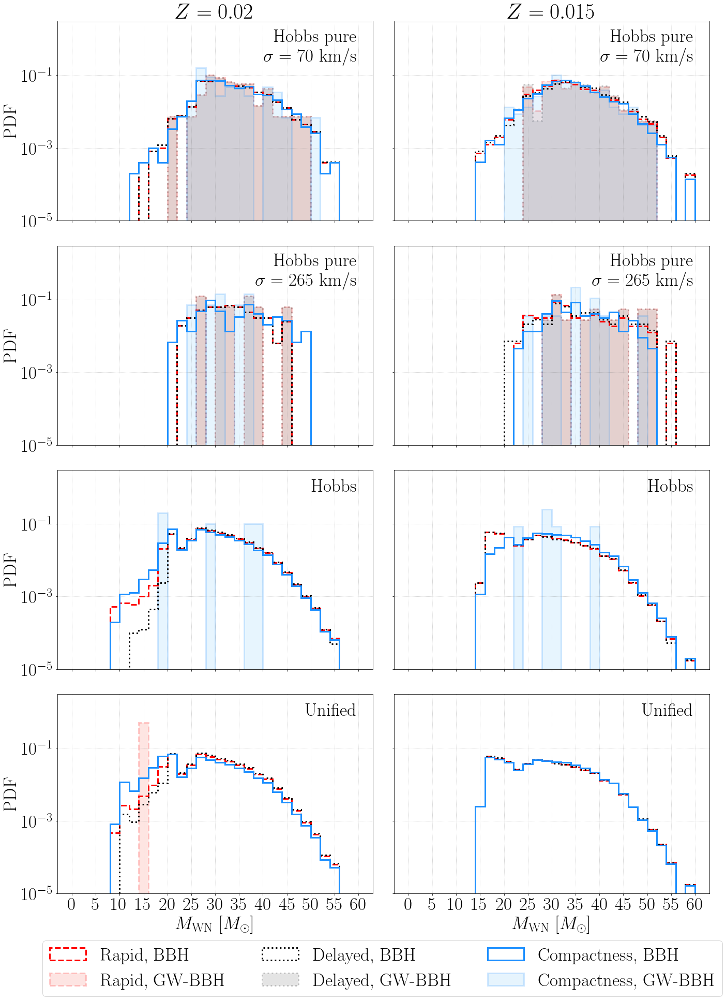

In [30]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] > 0) & (df['PhaseBSE_1'] != 14)]['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] > 0) & (df1['PhaseBSE_1'] != 14)]['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)

        axs[irow][icol].set_ylim(bottom=1e-5,top=3)
        axs[irow][icol].set_xticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm WN}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm WN}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-MWRnonpureHe.pdf')

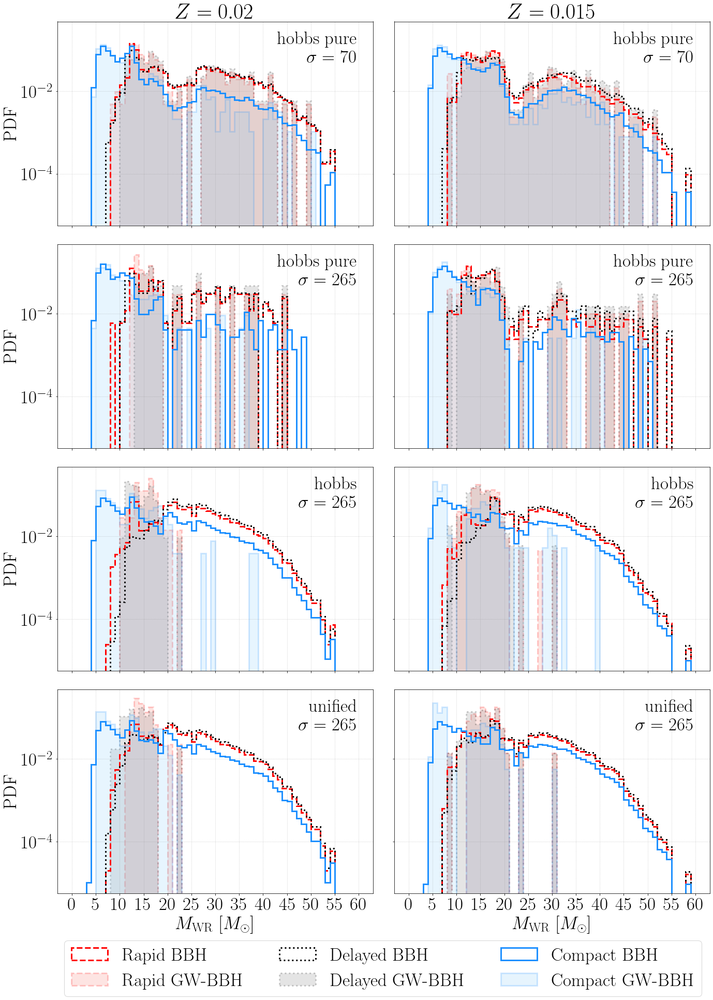

In [41]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[df['PhaseBSE_1'] != 14]['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[df1['PhaseBSE_1'] != 14]['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm WR}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm WR}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-MWR.pdf')

hobbs pure
$\sigma=70$ rap
          ID             name    Mass_0    Mass_1    Radius_1   RL1_fill  \
0        911  957556815776961  20.77205  30.82358   63.560940   0.313191   
4      18375  180464290561915  15.46140  27.71534  764.179800  11.330169   
5      30168  937786685741103  16.96652  41.54228   37.691820   0.324519   
7      44632  472373504156142  18.97359  34.65839    2.913192   0.018104   
10     48368  796985272562580  12.75288  29.16180  690.729600  10.426124   
..       ...              ...       ...       ...         ...        ...   
188   942984  677643706759455  22.62678  41.24995   39.054160   0.433970   
191   949993  168094937037821  15.83684  34.36214   12.193220   0.087975   
195   961579  704585298984629  14.16574  28.14435   35.629880   0.912774   
197   967981  223056794264960  19.68592  33.87334   34.913280   0.222444   
206  1033345  780926156252474  22.75918  37.80521   38.507180   0.413164   

     Semimajor  PhaseBSE_1    Period       GWtime  Eccentric

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


hobbs
$\sigma=265$ rap
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------
hobbs
$\sigma=265$ del
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------
hobbs
$\sigma=265$ com
          ID             name    Mass_0    Mass_1   Radius_1  RL1_fill  \
126   541022  113690385560561  14.01072  18.37244   1.599848  0.003307   
144   597138  645776949947302  15.48775  29.36990   2.465687  0.014673   
187   750277  895363116670590  18.43402  19.77246  14.182870  0.008166   
232   950117  514301545264533  16.25869  38.03893  19.667870  0.169379   
254  1029514  834690345147249  15.32827  37.00840  37.376510  0.371447   

     Semimajor  PhaseBSE_1     Period        GWtime  Eccentricity  
126  1201.5860         4.0   2.320025  3.592567e+10      0.110076  
144   386.0607         4.0   0.358992  4.023498e+05      0

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


unified
$\sigma=265$ del
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------


/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


unified
$\sigma=265$ com
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------
hobbs pure
$\sigma=70$ rap
          ID             name     Mass_0    Mass_1   Radius_1   RL1_fill  \
5      30168  937786685741103  29.437230  40.69185   39.41180   0.381052   
8      36781  865795588658707  27.622030  41.56637   19.46250   0.127766   
10     38893  374065784562490   8.485326  29.79962  904.54840  16.117907   
12     44632  472373504156142  30.695450  43.18172    3.48321   0.030057   
22     60095  479556357354518  16.317780  30.04043  920.53240   3.954450   
..       ...              ...        ...       ...        ...        ...   
403  1012075  306980515874578  25.018280  30.50384  905.67150   7.599056   
404  1014481  874761046167206  11.479490  29.89879  905.98800  12.457906   
413  1030748  262159002780427  27.838520  31.60511  904.54610   0.675653   
414  1033345  780926156252474  30.948180  

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


hobbs
$\sigma=265$ rap
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------
hobbs
$\sigma=265$ del
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------
hobbs
$\sigma=265$ com
          ID             name    Mass_0    Mass_1    Radius_1  RL1_fill  \
6      25062  524843036843427  22.44396  29.45705  919.526800  0.931565   
56    237348  862378046922586  24.61923  39.05084   25.805220  0.050825   
101   545562  645299640561474  25.41434  29.85313    2.337310  0.016940   
121   653469  151964255031847  11.40730  22.45080    6.582121  0.013847   
129   720766  793708595451456  21.75997  30.77437    2.454927  0.009217   
188  1033568  314983258924614  23.33213  29.03064   25.184620  0.035651   

     Semimajor  PhaseBSE_1    Period        GWtime  Eccentricity  
6    2451.3550         2.0  5.340001  8.860016

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


unified
$\sigma=265$ del
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------


/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


unified
$\sigma=265$ com
Empty DataFrame
Columns: [ID, name, Mass_0, Mass_1, Radius_1, RL1_fill, Semimajor, PhaseBSE_1, Period, GWtime, Eccentricity]
Index: []
----------


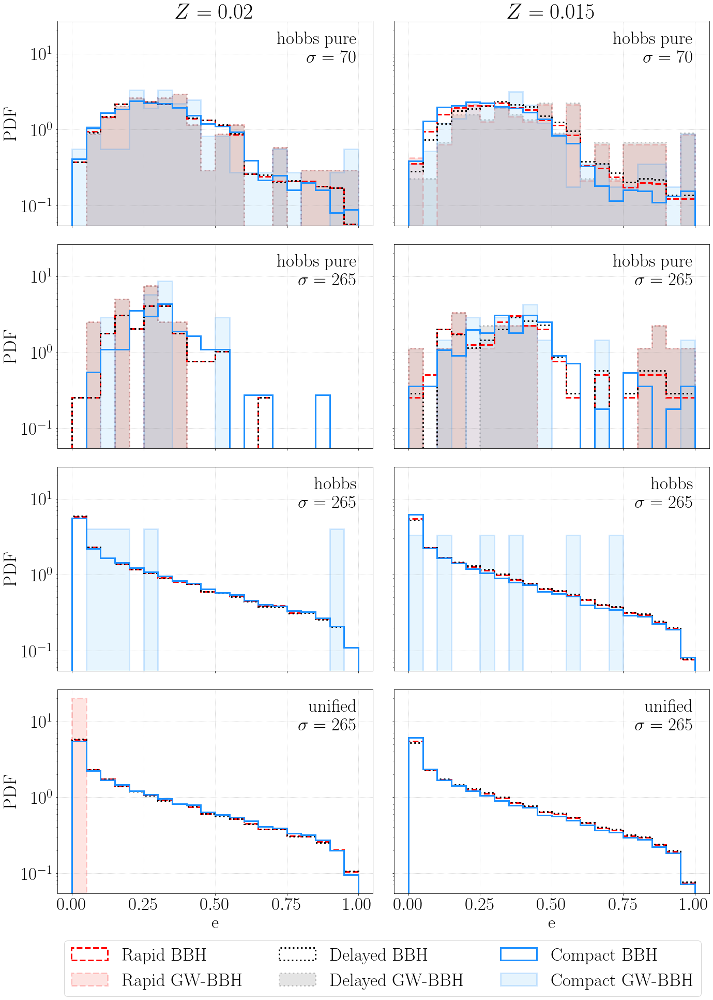

In [4]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.05)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] > 0) & (df['PhaseBSE_1'] != 14)]['Eccentricity'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] > 0) & (df1['PhaseBSE_1'] != 14)]['Eccentricity'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            print(kicklabel,SN)
            print(df1.loc[(df1['Hsup_1'] > 0) & (df1['PhaseBSE_1'] != 14)][['ID','name','Mass_0','Mass_1','Radius_1','RL1_fill','Semimajor','PhaseBSE_1','Period','GWtime','Eccentricity']])
            print('----------')
        #axs[irow][icol].set_yscale('log')
        #axs[irow][icol].set_xticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'e')
axs[3][1].set_xlabel(r'e')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-eccentricitynonpureHe.pdf')

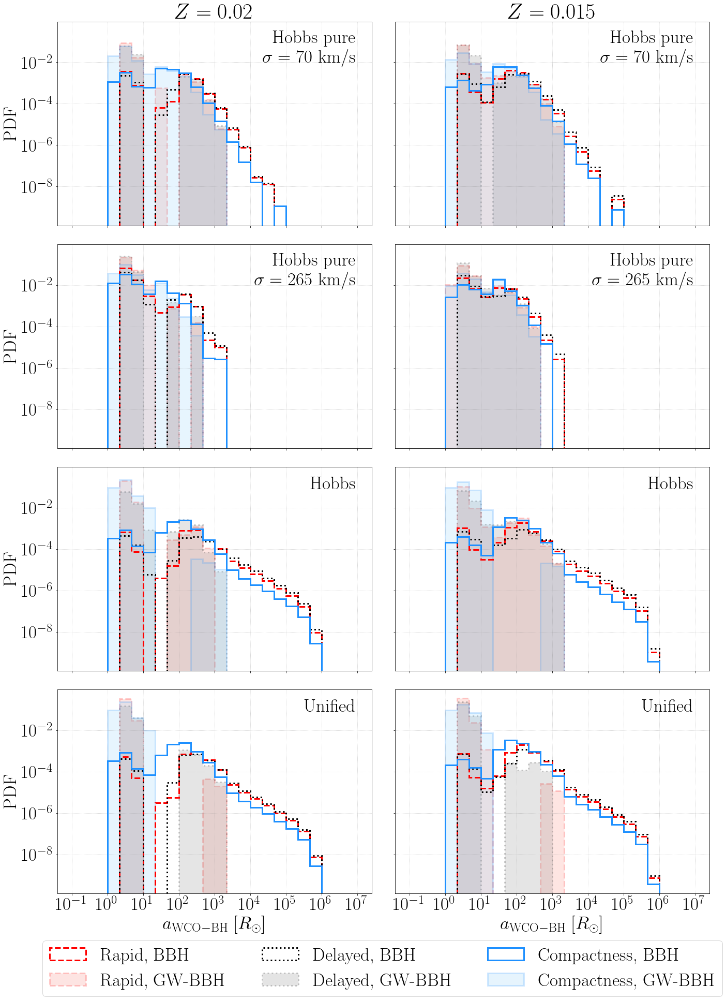

In [22]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] == 0) & (df['PhaseBSE_1'] != 14)]['Semimajor'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] == 0) & (df1['PhaseBSE_1'] != 14)]['Semimajor'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([0.1,1,10,100,1000,1e4,1e5,1e6,1e7]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a_{\rm WCO-BH}$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a_{\rm WCO-BH}$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-apureHe.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/hom

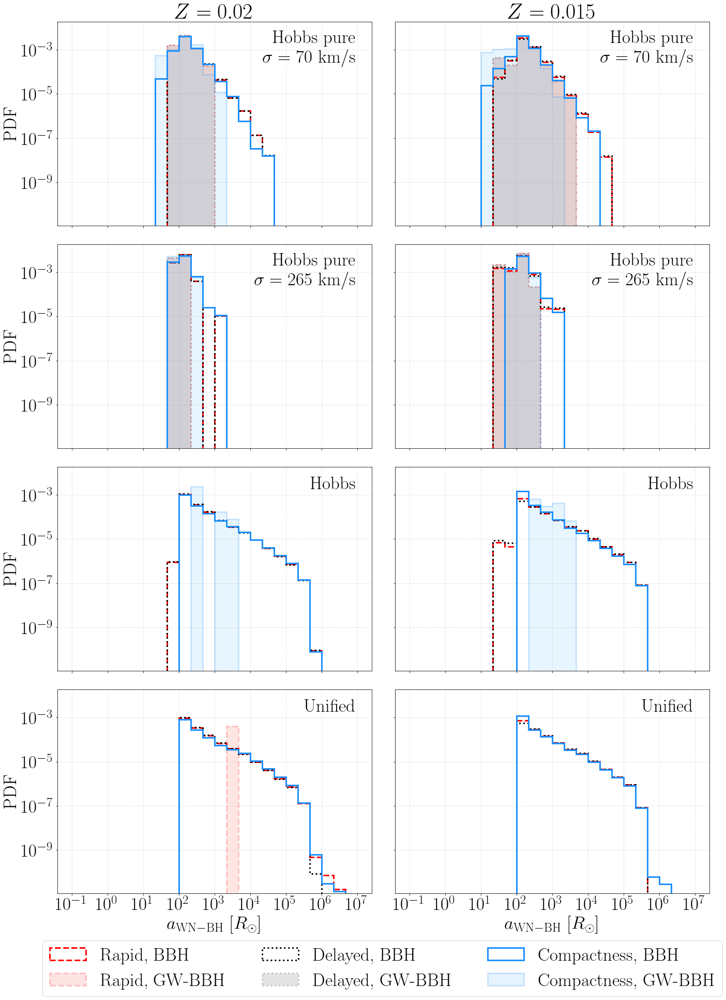

In [24]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] > 0) & (df['PhaseBSE_1'] != 14)]['Semimajor'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] > 0) & (df1['PhaseBSE_1'] != 14)]['Semimajor'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([0.1,1,10,100,1000,1e4,1e5,1e6,1e7]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a_{\rm WN-BH}$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a_{\rm WN-BH}$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-anonpureHe.pdf')

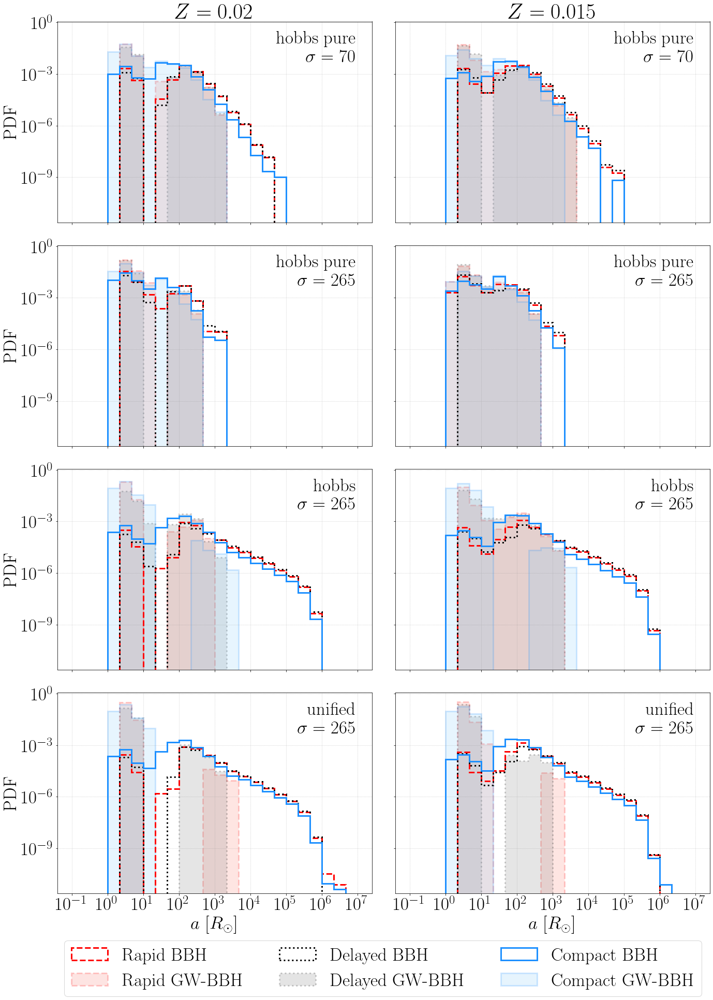

In [46]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[df['PhaseBSE_1'] != 14]['Semimajor'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[df1['PhaseBSE_1'] != 14]['Semimajor'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([0.1,1,10,100,1000,1e4,1e5,1e6,1e7]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-a.pdf')

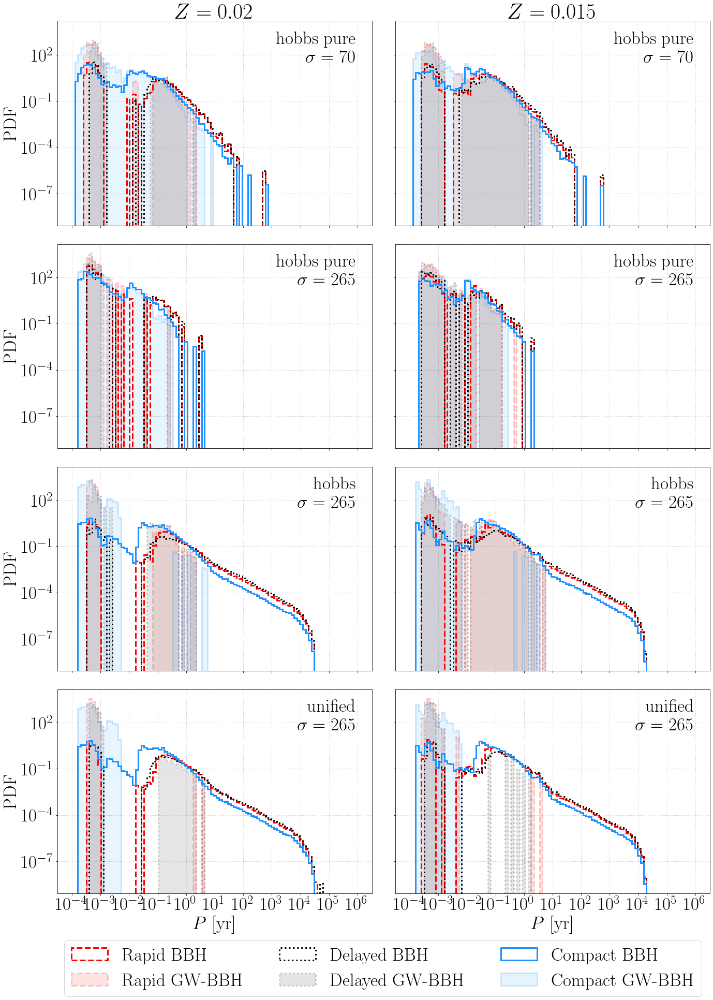

In [96]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e6),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] == 0) & (df['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] == 0) & (df1['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([1e-4,1e-3,0.01,0.1,1,10,100,1000,1e4,1e5,1e6]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P$ [yr]')
axs[3][1].set_xlabel(r'$P$ [yr]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-PpureHe.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/hom

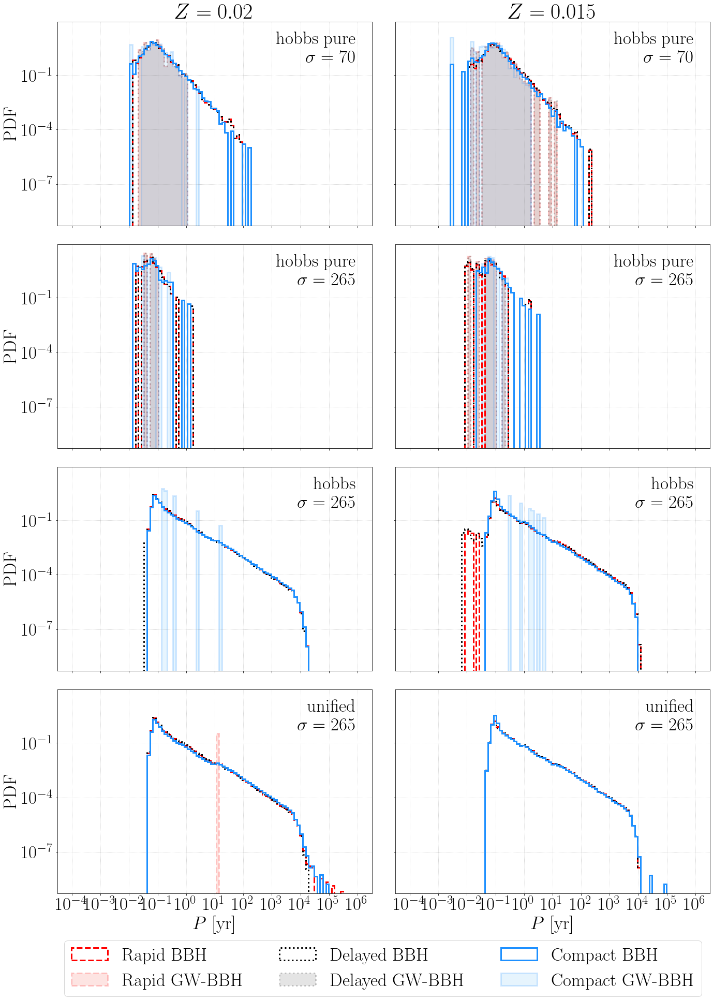

In [95]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e6),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] > 0) & (df['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] > 0) & (df1['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([1e-4,1e-3,0.01,0.1,1,10,100,1000,1e4,1e5,1e6]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P$ [yr]')
axs[3][1].set_xlabel(r'$P$ [yr]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-PnonpureHe.pdf')

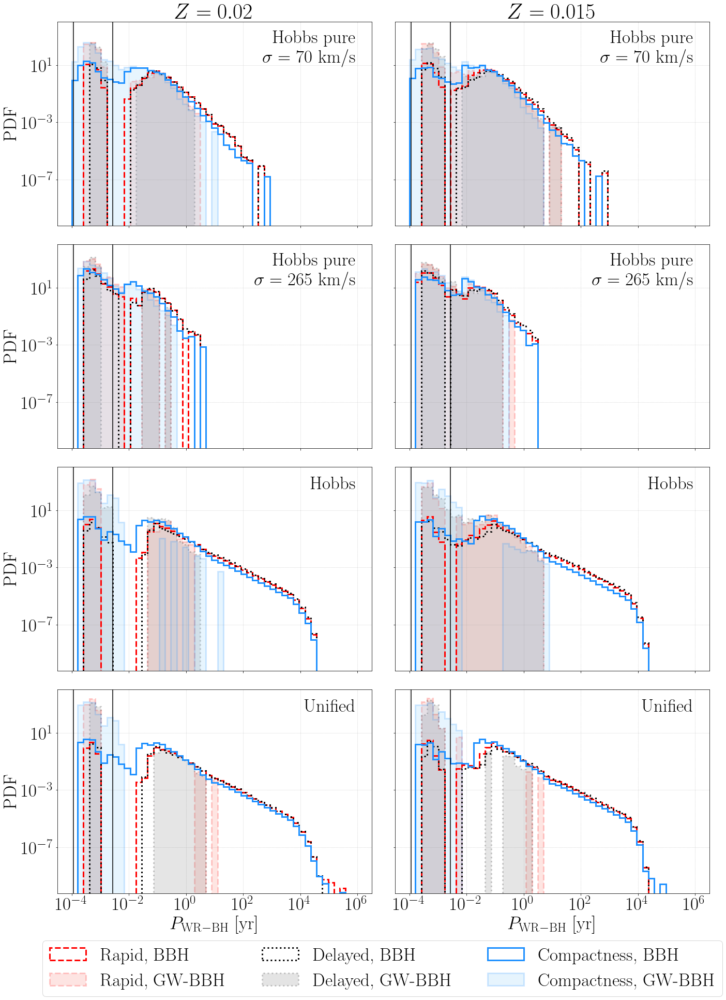

In [25]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e6),50)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['PhaseBSE_1'] != 14)]['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        axs[irow][icol].axvline(1./365., linestyle='solid',color='k')   
        axs[irow][icol].axvline(1./(365.*24.), linestyle='solid',color='k')   
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.array([1e-4,1e-2,1,100,1e4,1e6]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P_{\rm WR-BH}$ [yr]')
axs[3][1].set_xlabel(r'$P_{\rm WR-BH}$ [yr]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-P.pdf')

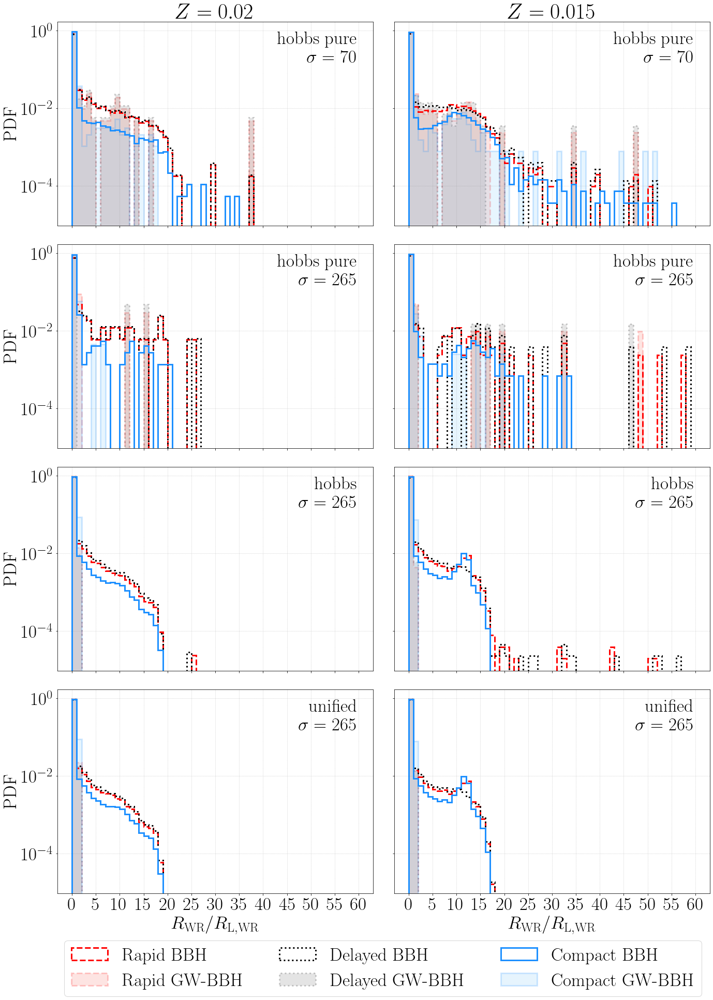

In [85]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-5),np.log10(1e6),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,61,1)       # 0.01 is the witdth of each bin


labels=['Rapid BBH','Delayed BBH','Compact BBH']
labels2=['Rapid GW-BBH','Delayed GW-BBH','Compact GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        #axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$R_{\rm WR}/R_{\rm L,WR}$')
axs[3][1].set_xlabel(r'$R_{\rm WR}/R_{\rm L,WR}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-RLfillWR.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/hom

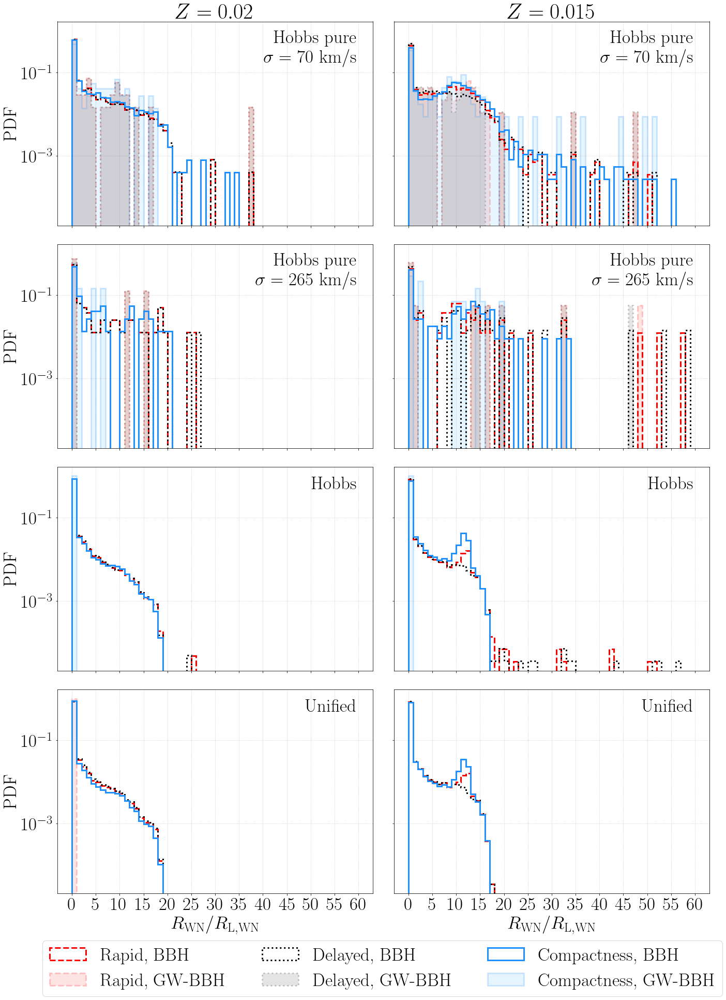

In [26]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-5),np.log10(1e6),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,61,1)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] > 0) &(df['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] > 0) &(df1['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
            
        #axs[irow][icol].set_xscale('log')
        axs[irow][icol].xaxis.set_ticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$R_{\rm WN}/R_{\rm L,WN}$')
axs[3][1].set_xlabel(r'$R_{\rm WN}/R_{\rm L,WN}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-RLfillWRnonpureHe.pdf')

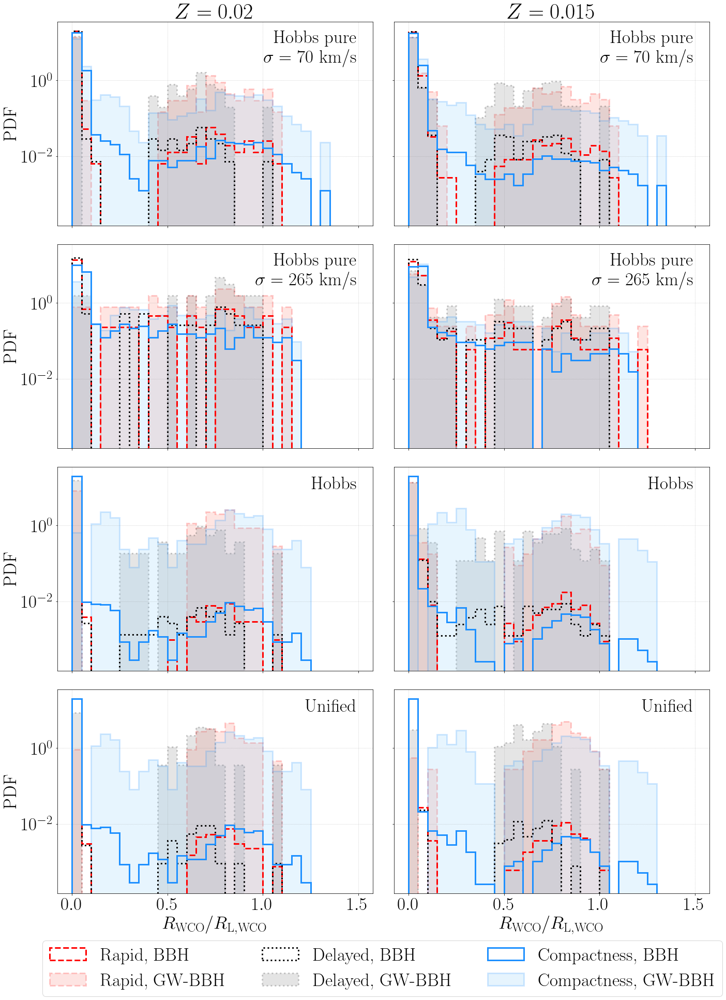

In [27]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-5),np.log10(1e6),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e7),25)  # divide into 25 bins    
bin_edges_q=np.arange(0,1.51,0.05)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df.loc[(df['Hsup_1'] == 0) &(df['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1.loc[(df1['Hsup_1'] == 0) &(df1['PhaseBSE_1'] != 14)]['RL1_fill'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            #print(df1.loc[(df1['Hsup_1'] == 0) &(df1['PhaseBSE_1'] == 7)][['PhaseBSE_1','RL1_fill']])
            
        #axs[irow][icol].set_xscale('log')
        #axs[irow][icol].xaxis.set_ticks(np.array([1e-5,1e-4,1e-3,0.001,0.1,1,10,100]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$R_{\rm WCO}/R_{\rm L,WCO}$')
axs[3][1].set_xlabel(r'$R_{\rm WCO}/R_{\rm L,WCO}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBH-RLfillpureHe.pdf')

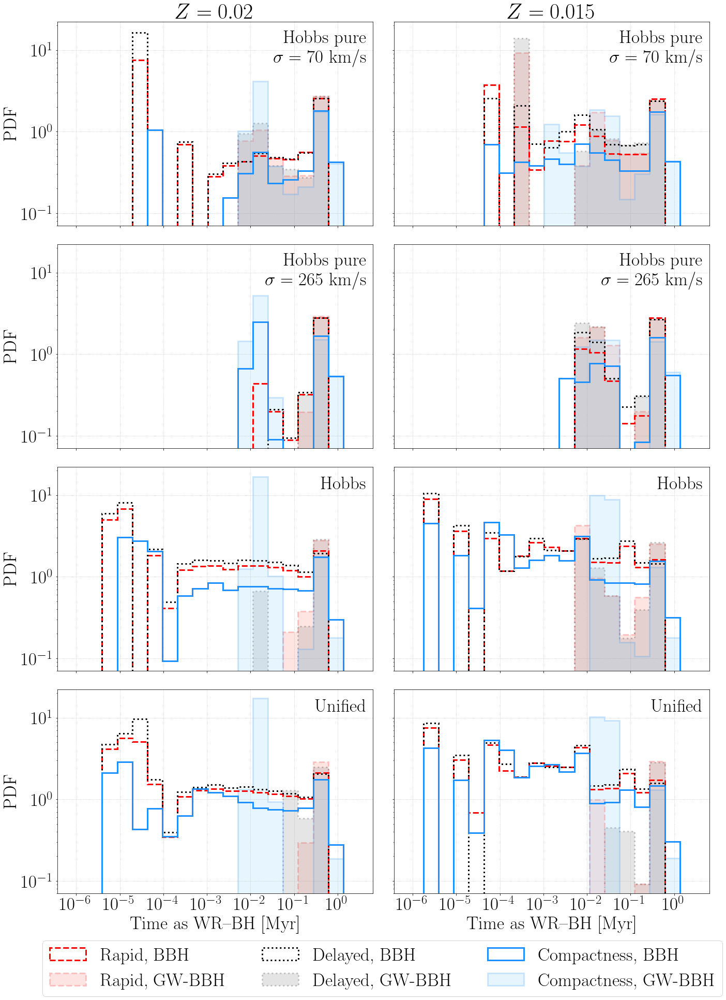

In [28]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(8e-7),np.log10(3),20)


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df2 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            df4 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df2['BWorldtime']-df1['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df4['BWorldtime']-df3['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time as WR--BH [Myr]')
axs[3][1].set_xlabel(r'Time as WR--BH [Myr]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBHtime.pdf')

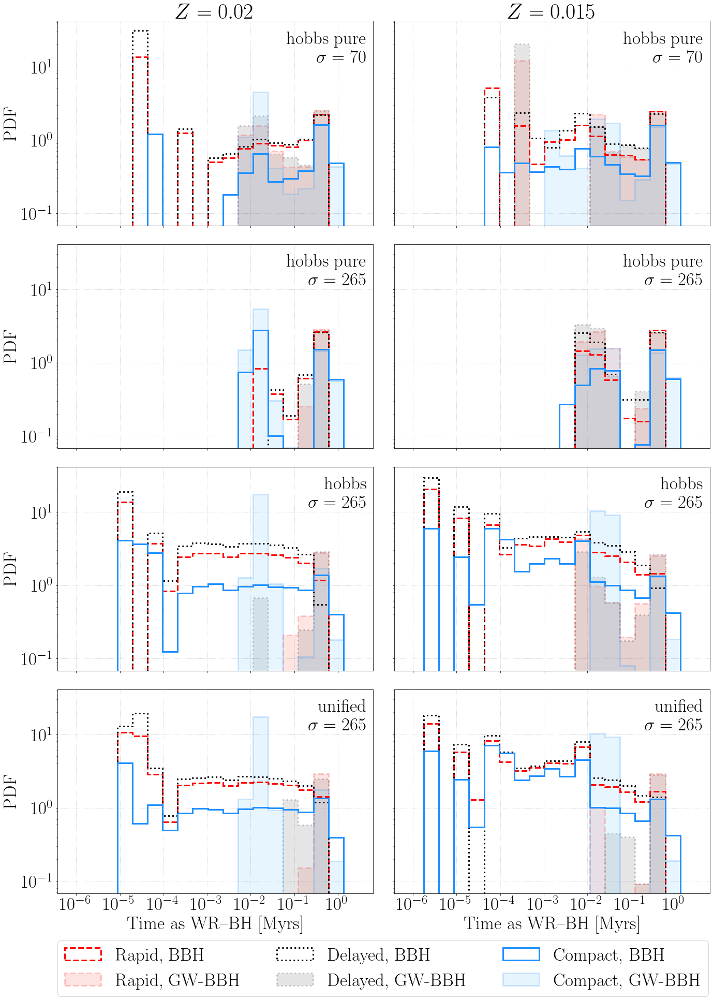

In [73]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(8e-7),np.log10(3),20)


labels=['Rapid, BBH','Delayed, BBH','Compact, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df2 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            df4 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df2.loc[(df2['Hsup_1'] == 0) &(df2['PhaseBSE_1'] != 14)]['BWorldtime'] - df1.loc[(df1['Hsup_1'] == 0) &(df1['PhaseBSE_1'] != 14)]['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df4.loc[(df4['Hsup_1'] == 0) &(df4['PhaseBSE_1'] != 14)]['BWorldtime'] - df3.loc[(df3['Hsup_1'] == 0) &(df3['PhaseBSE_1'] != 14)]['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time as WR--BH [Myrs]')
axs[3][1].set_xlabel(r'Time as WR--BH [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBHtimepureHe.pdf')

/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/matpl

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
/home/erika/.local/lib/python3.8/site-packages/matplotlib/axes/_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/pytho

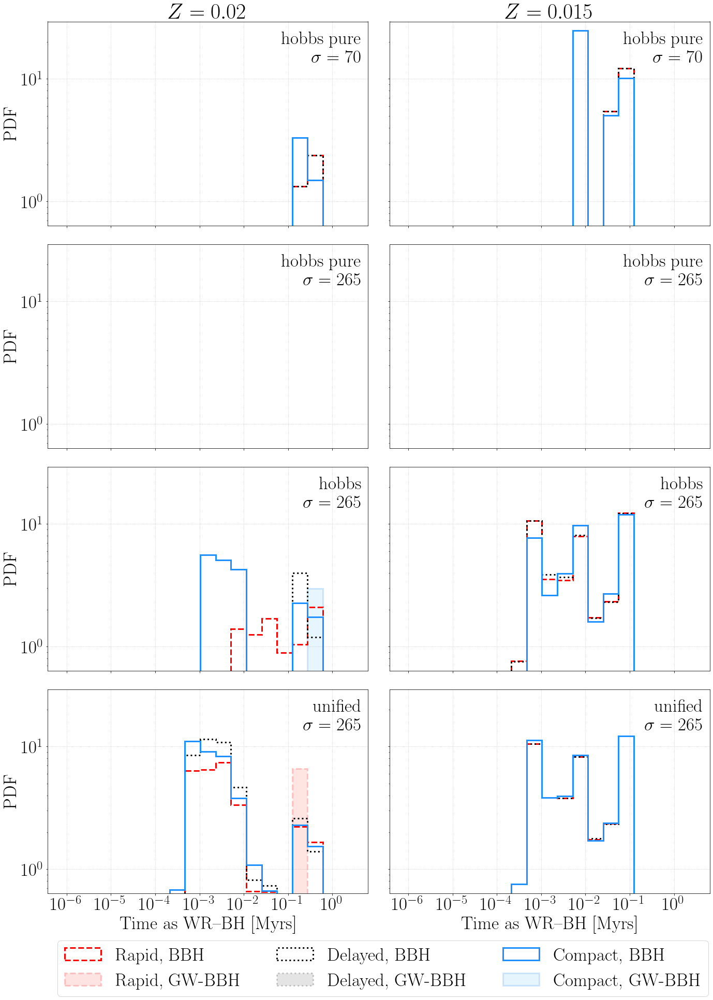

In [74]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(8e-7),np.log10(3),20)


labels=['Rapid, BBH','Delayed, BBH','Compact, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            df2 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            df4 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df2.loc[(df2['Hsup_1'] > 0) &(df2['PhaseBSE_1'] != 14)]['BWorldtime'] - df1.loc[(df1['Hsup_1'] > 0) &(df1['PhaseBSE_1'] != 14)]['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df4.loc[(df4['Hsup_1'] > 0) &(df4['PhaseBSE_1'] != 14)]['BWorldtime'] - df3.loc[(df3['Hsup_1'] > 0) &(df3['PhaseBSE_1'] != 14)]['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time as WR--BH [Myrs]')
axs[3][1].set_xlabel(r'Time as WR--BH [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}WRBHtimenonpureHe.pdf')

# Remnants

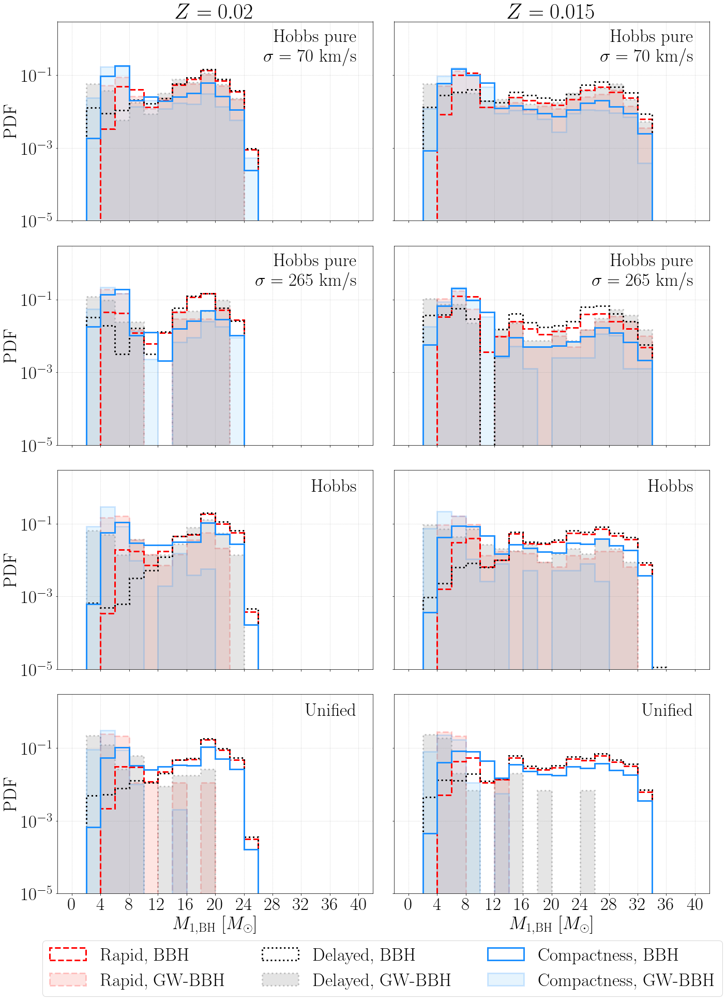

In [31]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,41,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Mass_0'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_0'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        axs[irow][icol].set_ylim(bottom=1e-5,top=3)
        axs[irow][icol].set_xticks(np.arange(0,41,4))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')

        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm 1, BH}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm 1, BH}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}remM1.pdf')

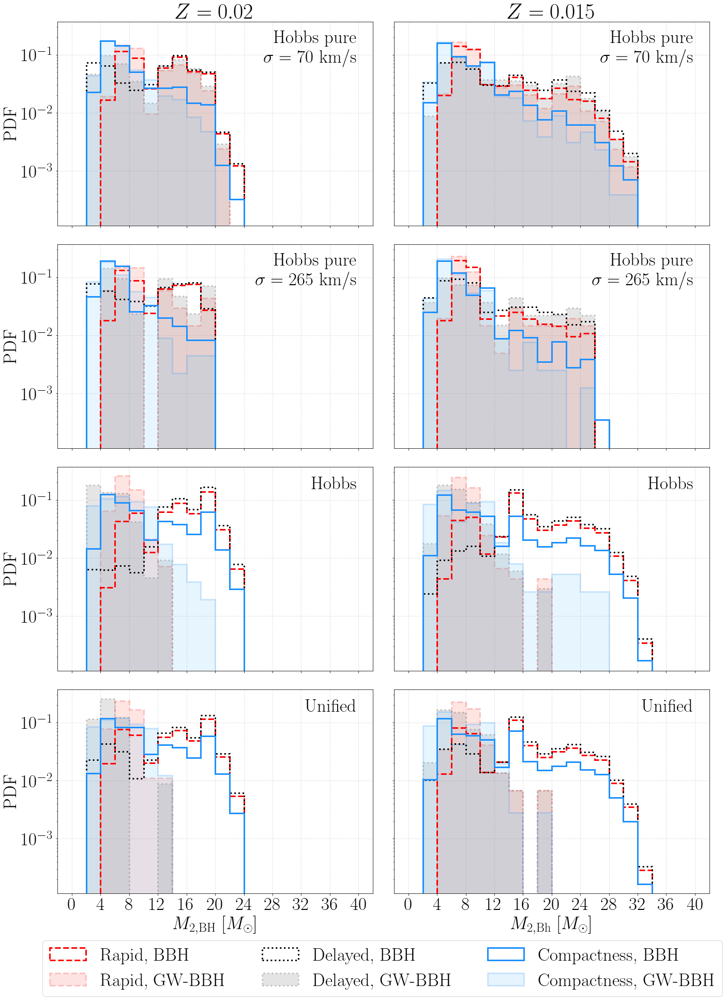

In [32]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,41,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,41,4))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_{\rm 2,BH}$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_{\rm 2, Bh}$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}remM2.pdf')

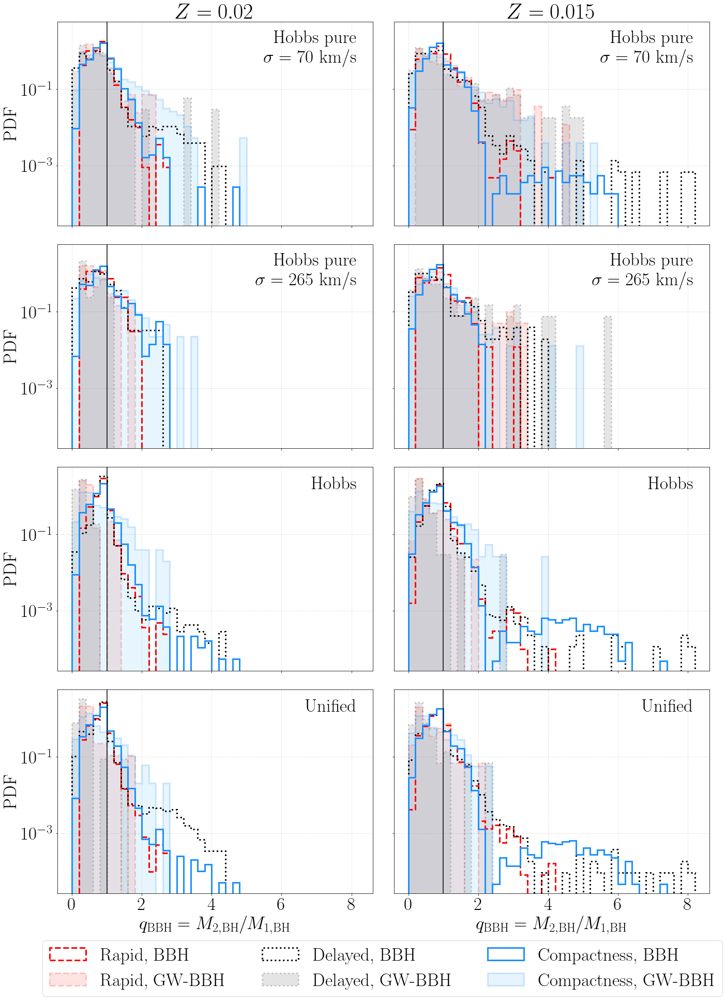

In [33]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,8.21,0.2)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Mass_1']/df['Mass_0'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1']/df['Mass_0'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        axs[irow][icol].axvline(1,color='k',linestyle='solid')
        #axs[irow][icol].set_yscale('log')
        #axs[irow][icol].set_xticks(np.arange(0,41,4))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$q_{\rm BBH}=M_{\rm 2,BH}/M_{\rm 1,BH}$')
axs[3][1].set_xlabel(r'$q_{\rm BBH}=M_{\rm 2,BH}/M_{\rm 1,BH}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}remq.pdf')

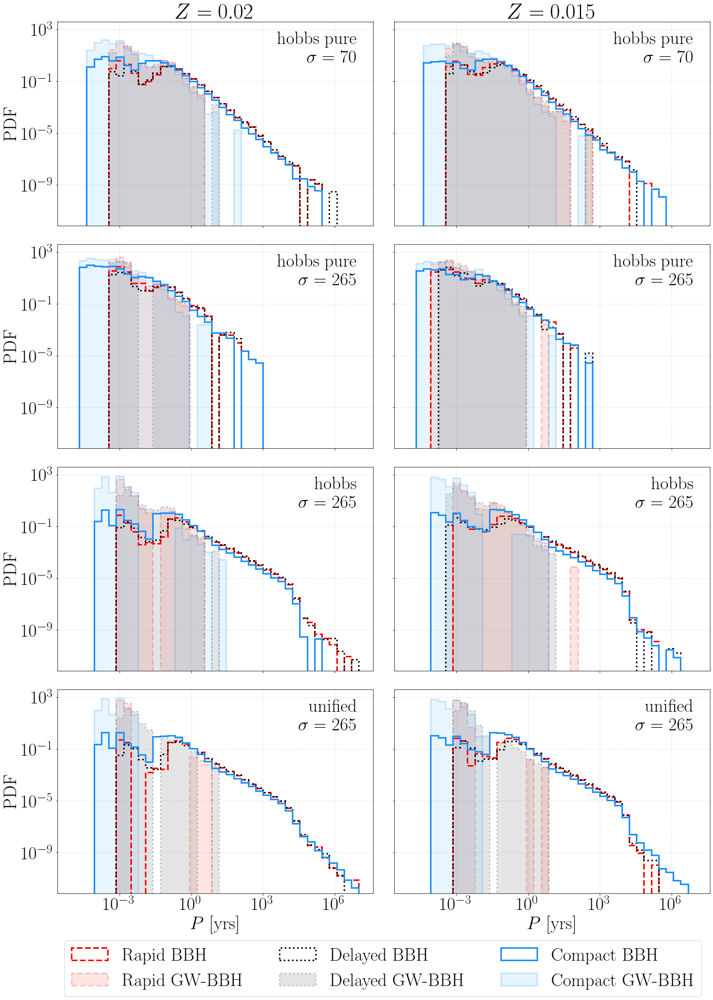

In [93]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-5),np.log10(1e7),40)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        axs[irow][icol].set_xscale('log')
        #axs[irow][icol].set_xticks(np.arange(0,41,4))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P$ [yrs]')
axs[3][1].set_xlabel(r'$P$ [yrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}remP.pdf')

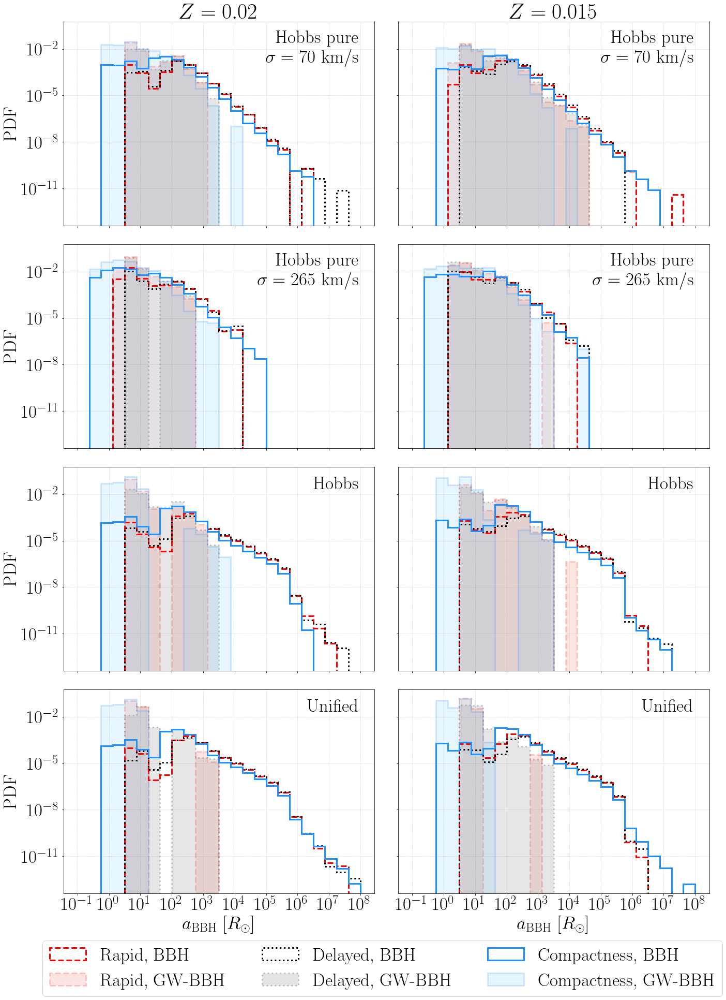

In [34]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(0.1),np.log10(1e8),25)  # divide into 50 bins
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure' + '\n' +r'$\sigma=70$ km/s', r'Hobbs pure' + '\n' +r'$\sigma=265$ km/s',r'Hobbs' + '\n',r'Unified'+'\n']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Semimajor'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Semimajor'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([0.1,1,10,100,1e3,1e4,1e5,1e6,1e7,1e8]))
        axs[irow][icol].annotate(kicklabel, (0.95,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a_{\rm BBH}$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a_{\rm BBH}$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}rema.pdf')

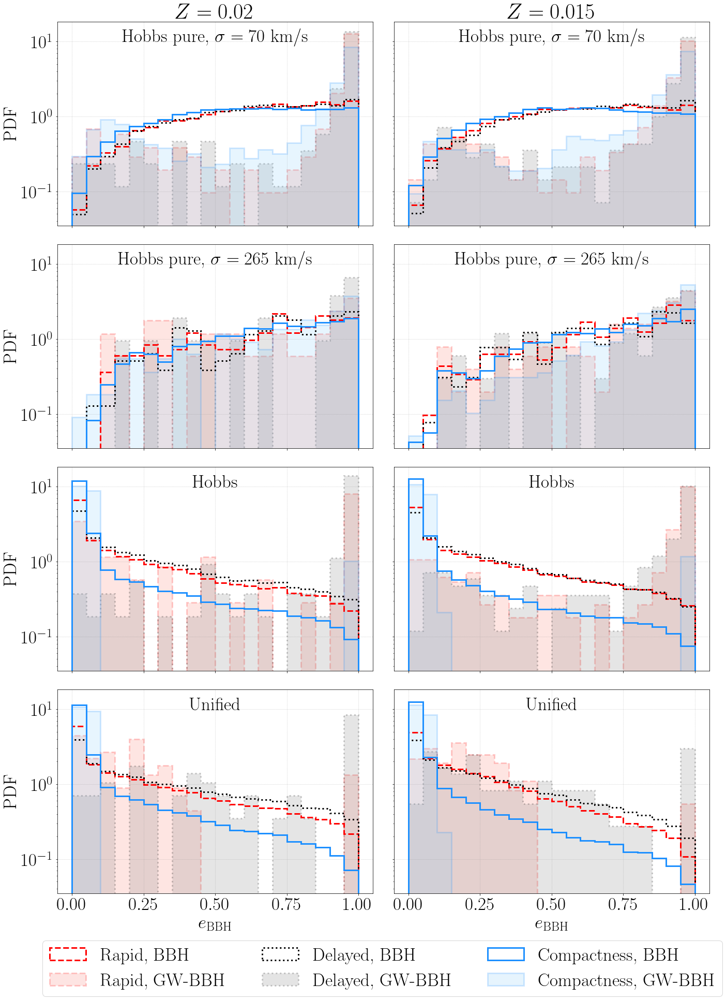

In [36]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,61,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.05)       # 0.01 is the witdth of each bin


labels=['Rapid, BBH','Delayed, BBH','Compactness, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compactness, GW-BBH']
kicklabels = [r'Hobbs pure, $\sigma=70$ km/s', r'Hobbs pure, $\sigma=265$ km/s',r'Hobbs',r'Unified']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color, color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')

            axs[irow][icol].hist(df['Eccentricity'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Eccentricity'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
#         print(kicklabel,SN)
#         print(df1.loc[df1['Eccentricity']>=0.99][['ID','name','Mass_0','Mass_1','Radius_1','Semimajor','PhaseBSE_1','Period','GWtime','Eccentricity']])
#         print('----------')

        #axs[irow][icol].set_yscale('log')
        #axs[irow][icol].set_xticks(np.arange(0,61,5))
        axs[irow][icol].annotate(kicklabel, (0.5,0.9),xycoords='axes fraction', color='k',ha='center')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$e_{\rm BBH}$')
axs[3][1].set_xlabel(r'$e_{\rm BBH}$')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}remeccentricity.pdf')

# Time spent before, while and after WRBH

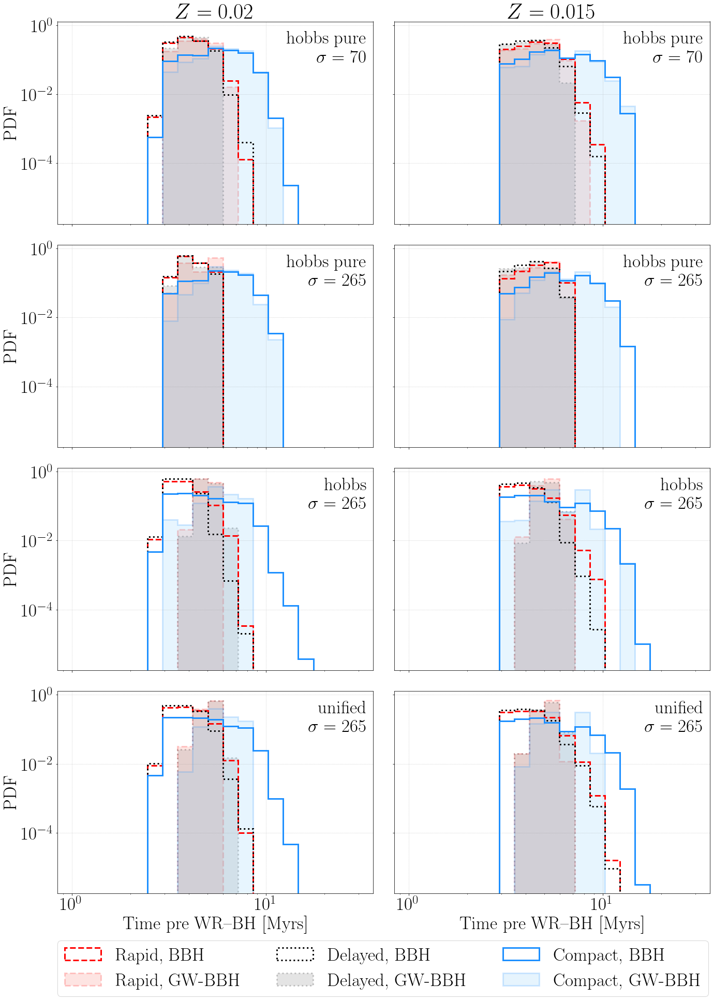

In [57]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(1),np.log10(30),20)


labels=['Rapid, BBH','Delayed, BBH','Compact, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df1['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df3['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1,1e1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time pre WR--BH [Myrs]')
axs[3][1].set_xlabel(r'Time pre WR--BH [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}preWRBHtime.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/hom

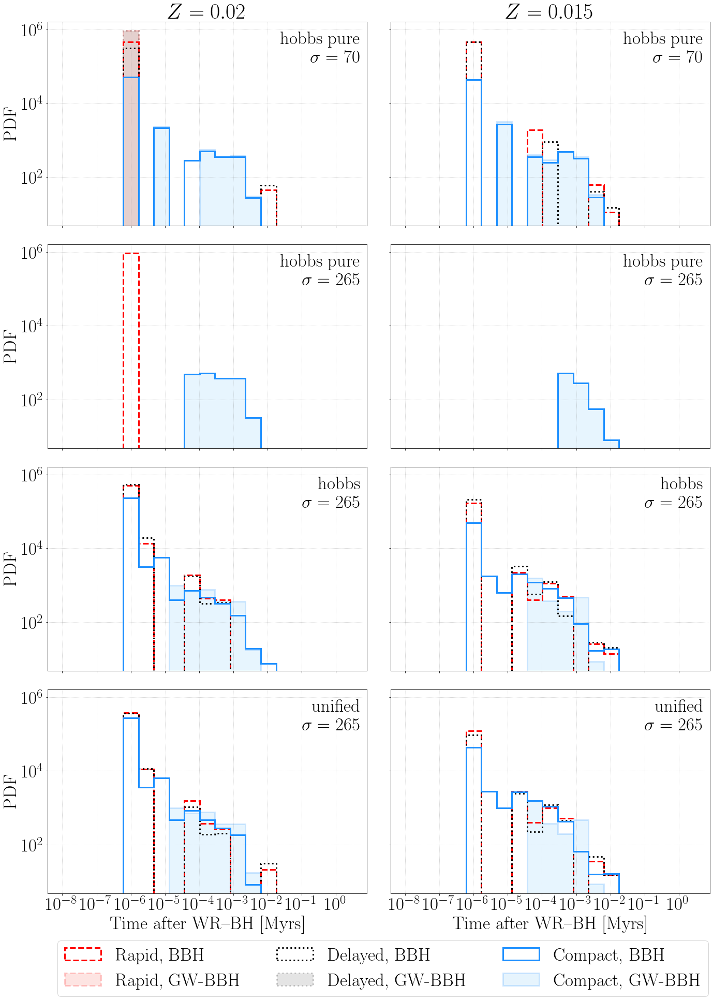

In [61]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(1e-8),np.log10(3),20)


labels=['Rapid, BBH','Delayed, BBH','Compact, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            df2 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')
            df4 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df1['BWorldtime']-df2['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df3['BWorldtime']-df4['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time after WR--BH [Myrs]')
axs[3][1].set_xlabel(r'Time after WR--BH [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}afterWRBHtime.pdf')

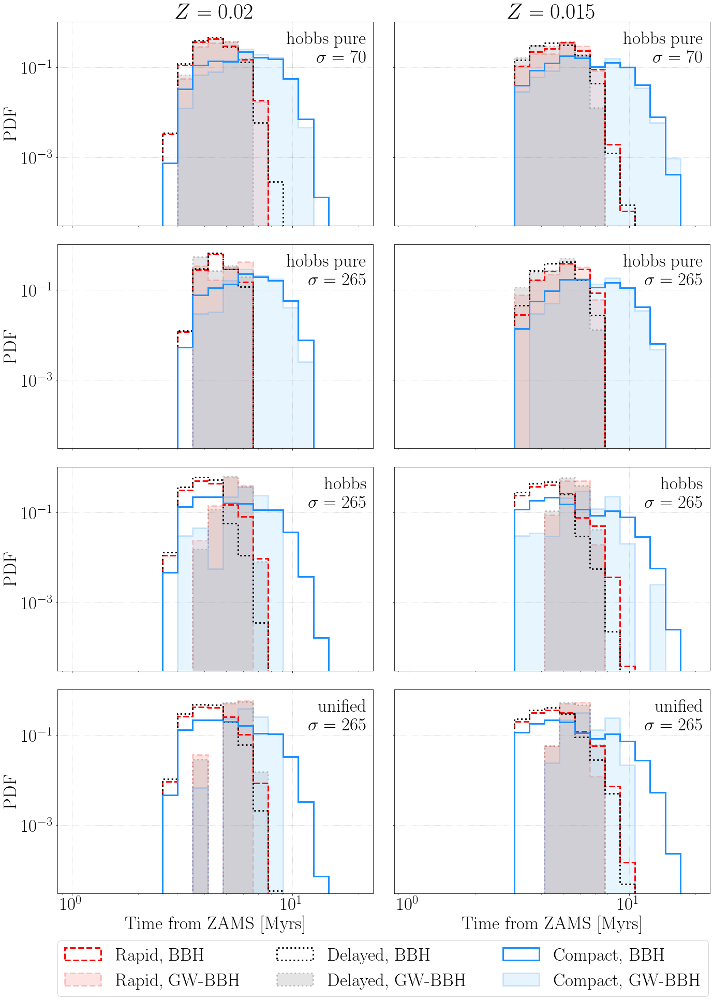

In [11]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_WRBHtime = np.logspace(np.log10(1),np.log10(20),20)


labels=['Rapid, BBH','Delayed, BBH','Compact, BBH']
labels2=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_bound_WRBH.csv')
            
            df3 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')
            

            axs[irow][icol].hist(df1['BWorldtime'], bins=bin_edges_WRBHtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df3['BWorldtime'], bins=bin_edges_WRBHtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        #axs[irow][icol].set_xticks(np.array([1e-8,1e-7,1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time from ZAMS [Myrs]')
axs[3][1].set_xlabel(r'Time from ZAMS [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}evotimetotal.pdf')

# Cyg X-3

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


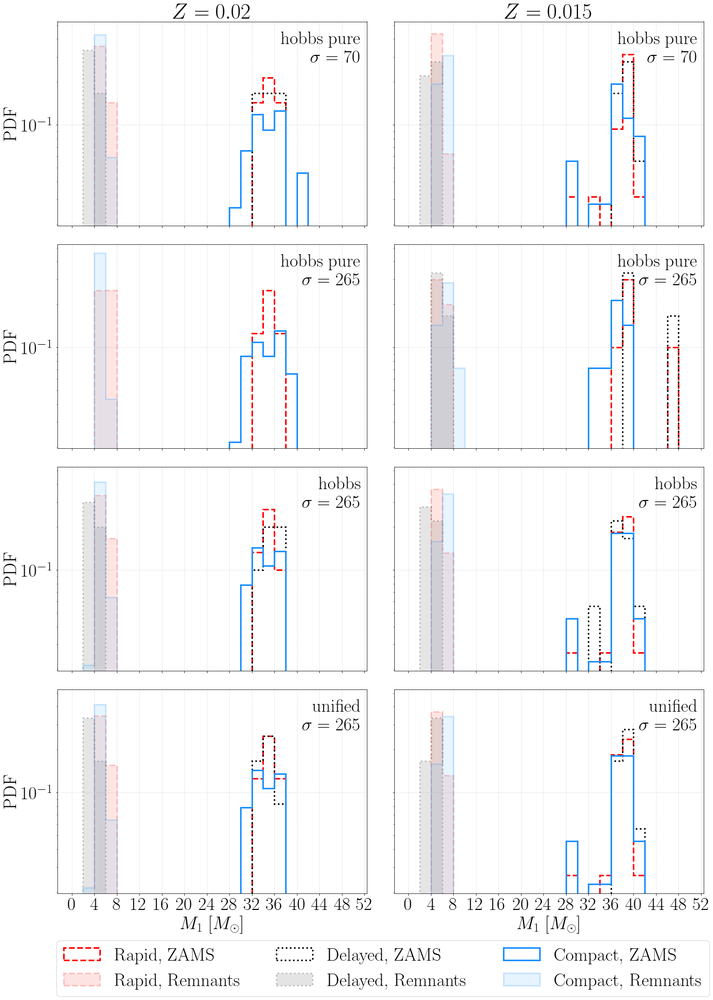

In [95]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,51,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, ZAMS','Delayed, ZAMS','Compact, ZAMS']
labels2=['Rapid, Remnants','Delayed, Remnants','Compact, Remnants']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_0'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_0'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,53,4))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_1$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_1$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3M1.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


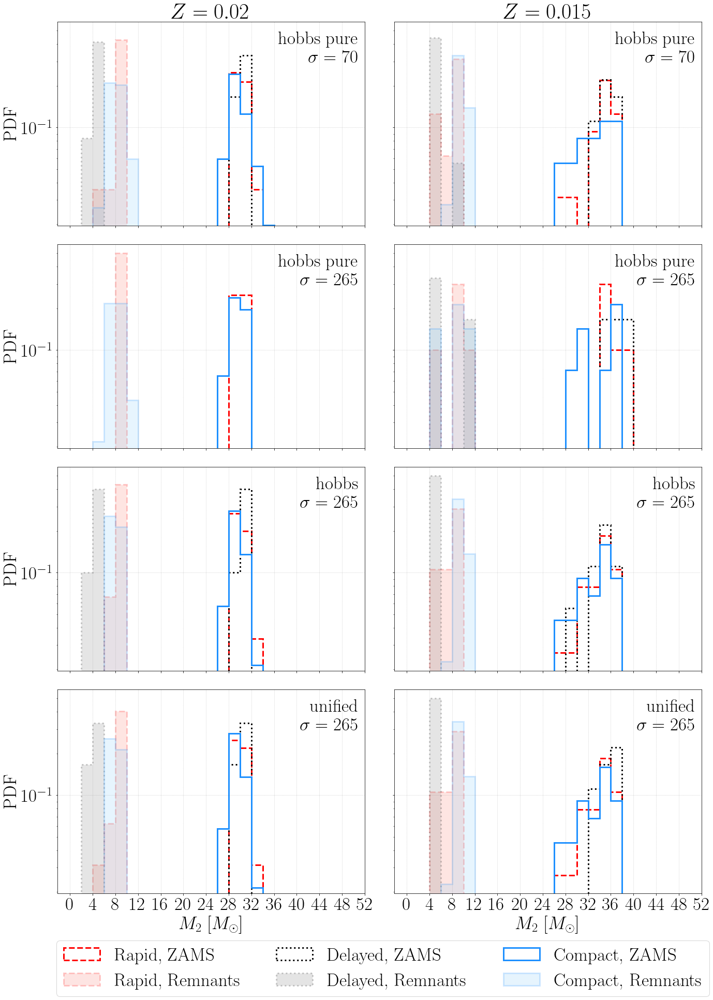

In [96]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,46,2)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, ZAMS','Delayed, ZAMS','Compact, ZAMS']
labels2=['Rapid, Remnants','Delayed, Remnants','Compact, Remnants']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_1'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        axs[irow][icol].set_xticks(np.arange(0,53,4))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$M_2$ [$M_\odot$]')
axs[3][1].set_xlabel(r'$M_2$ [$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3M2.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


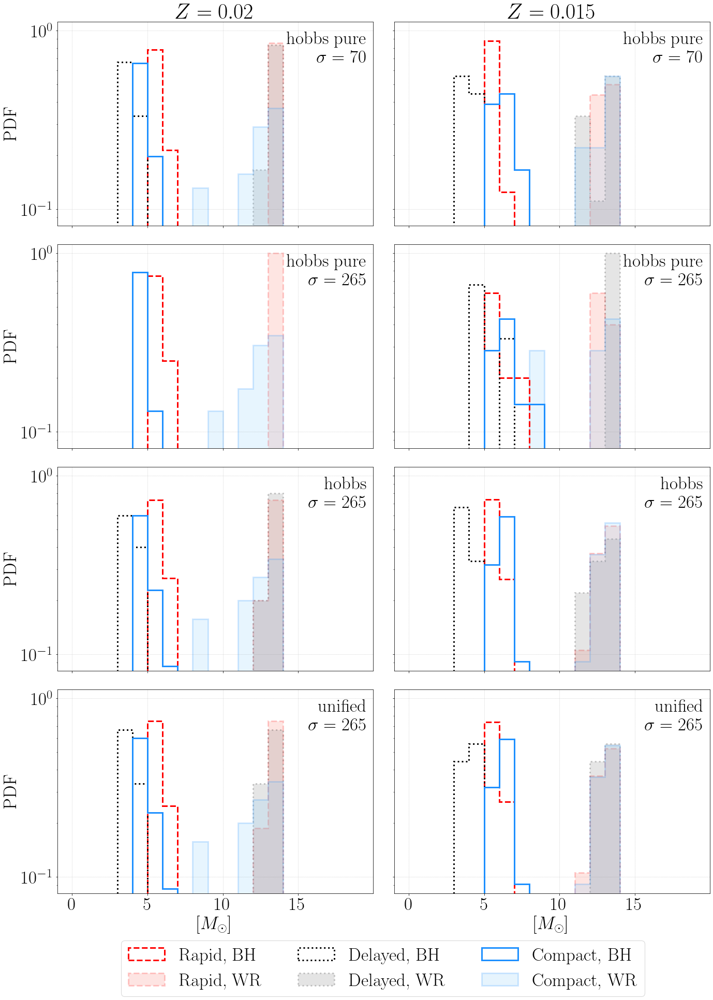

In [ ]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,20,1)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, BH','Delayed, BH','Compact, BH']
labels2=['Rapid, WR','Delayed, WR','Compact, WR']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_0'], bins=bin_edges_mass, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df['Mass_1'], bins=bin_edges_mass, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_yscale('log')
        #axs[irow][icol].set_xticks(np.arange(0,53,4))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'[$M_\odot$]')
axs[3][1].set_xlabel(r'[$M_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3MBHMWR.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


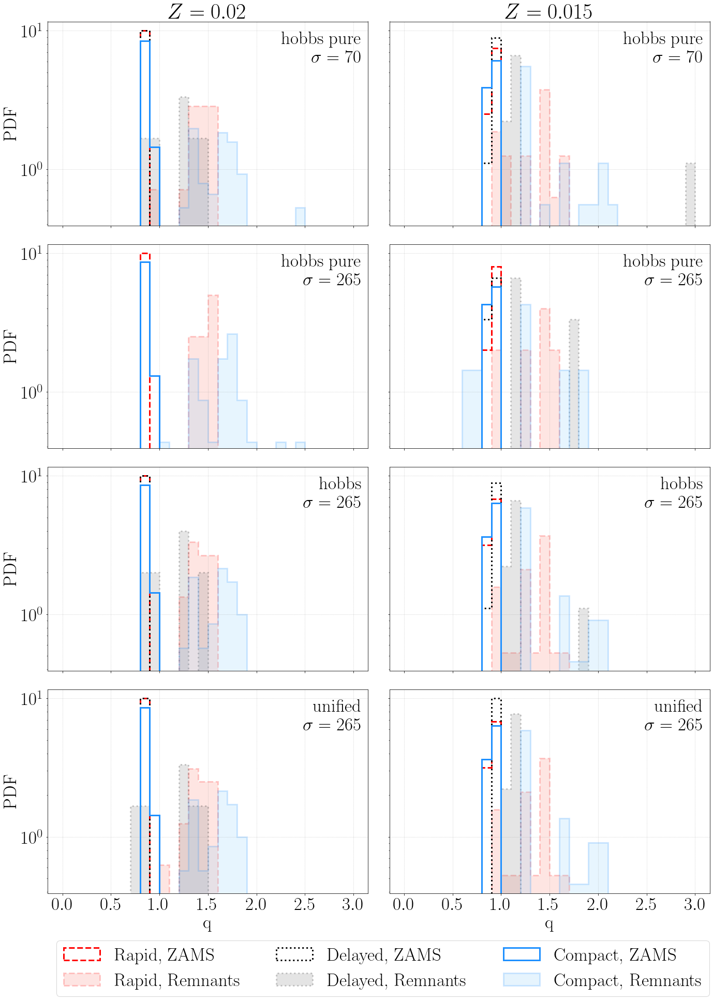

In [97]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 1 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_q=np.arange(0,3.1,0.1)       # 0.01 is the witdth of each bin


labels=['Rapid, ZAMS','Delayed, ZAMS','Compact, ZAMS']
labels2=['Rapid, Remnants','Delayed, Remnants','Compact, Remnants']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Mass_1']/df['Mass_0'], bins=bin_edges_q, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Mass_1']/df1['Mass_0'], bins=bin_edges_q, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        
        #axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.arange(0,3.1,0.5))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'q')
axs[3][1].set_xlabel(r'q')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3q.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


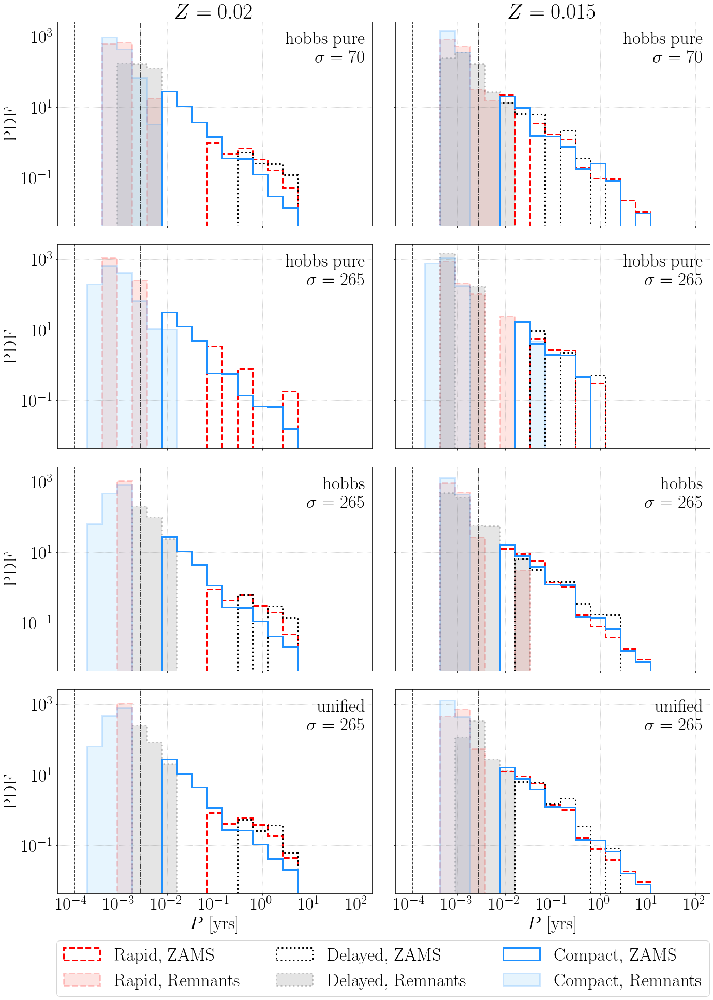

In [98]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, ZAMS','Delayed, ZAMS','Compact, ZAMS']
labels2=['Rapid, Remnants','Delayed, Remnants','Compact, Remnants']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['Period'], bins=bin_edges_period, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Period'], bins=bin_edges_period, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        axs[irow][icol].axvline(1./365., linestyle='dashdot',color='k')
        axs[irow][icol].axvline(1./(365.*24.), linestyle='dashed',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-4,1e-3,1e-2,0.1,1,10,100]))
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$P$ [yrs]')
axs[3][1].set_xlabel(r'$P$ [yrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3P.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges
/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


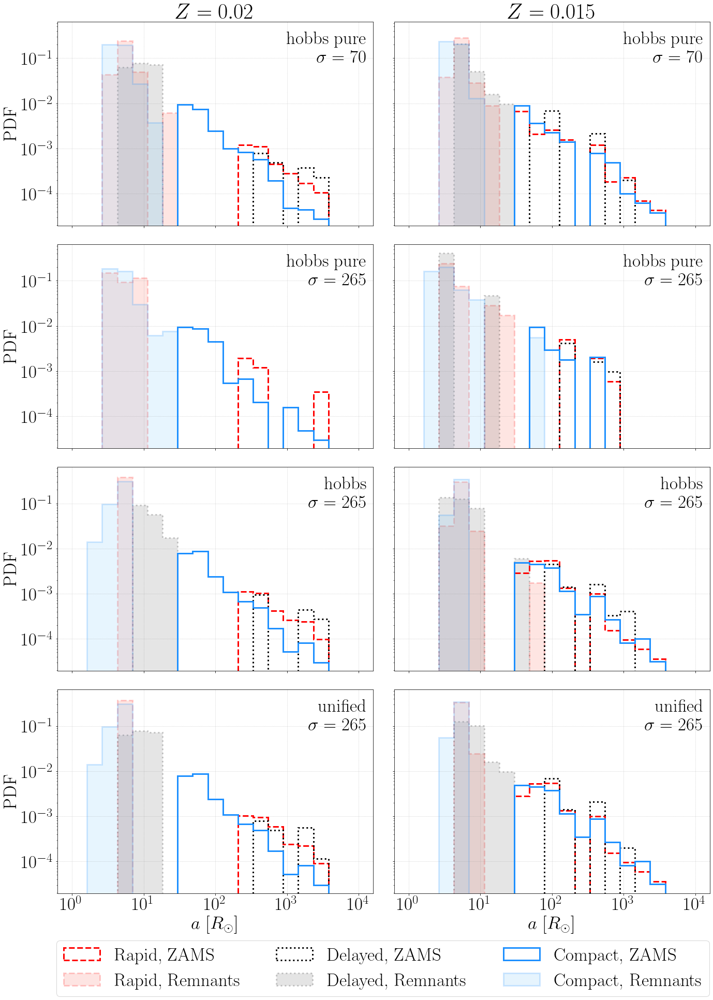

In [99]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(0.001),np.log10(10000),100)
bin_edges_semimajor=np.logspace(np.log10(1),np.log10(1e4),20)  # divide into 50 bins
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin


labels=['Rapid, ZAMS','Delayed, ZAMS','Compact, ZAMS']
labels2=['Rapid, Remnants','Delayed, Remnants','Compact, Remnants']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/progenitors/p_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['a'], bins=bin_edges_semimajor, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['Semimajor'], bins=bin_edges_semimajor, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)

        axs[irow][icol].set_xscale('log')
        axs[irow][icol].annotate(kicklabel, (0.98,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')        
        axs[irow][icol].xaxis.set_ticks(np.array([1,10,100,1000,1e4]))

#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'$a$ [$R_\odot$]')
axs[3][1].set_xlabel(r'$a$ [$R_\odot$]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3a.pdf')

# Cyg X-3 and GW--BBHs

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


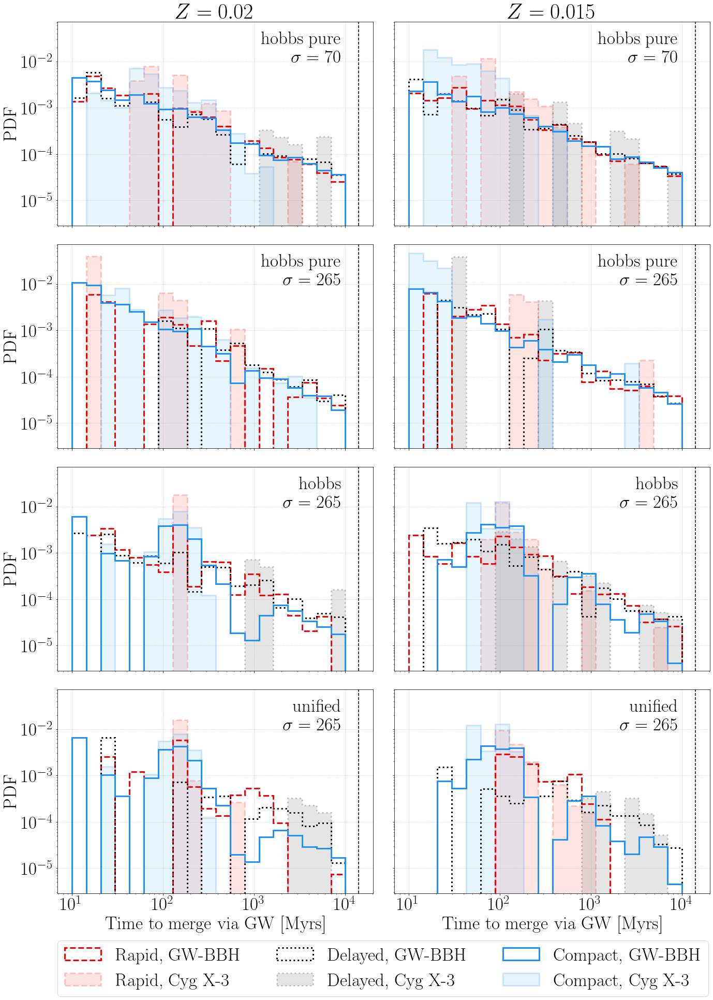

In [8]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_GWtime = np.logspace(np.log10(10),np.log10(1e4),20)


labels=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
labels2=['Rapid, Cyg X-3','Delayed, Cyg X-3','Compact, Cyg X-3']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/remnants/r_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['GWtime'], bins=bin_edges_GWtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df1['GWtime'], bins=bin_edges_GWtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        axs[irow][icol].axvline(14000, linestyle='dashed',color='k') 
        #axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        #axs[irow][icol].set_xticks(np.array([1e-6,1e-4,1e-2,1,100,1e4]))
        axs[irow][icol].annotate(kicklabel, (0.9,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time to merge via GW [Myrs]')
axs[3][1].set_xlabel(r'Time to merge via GW [Myrs]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}GWtime.pdf')

/home/erika/.local/lib/python3.8/site-packages/numpy/lib/histograms.py:905: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


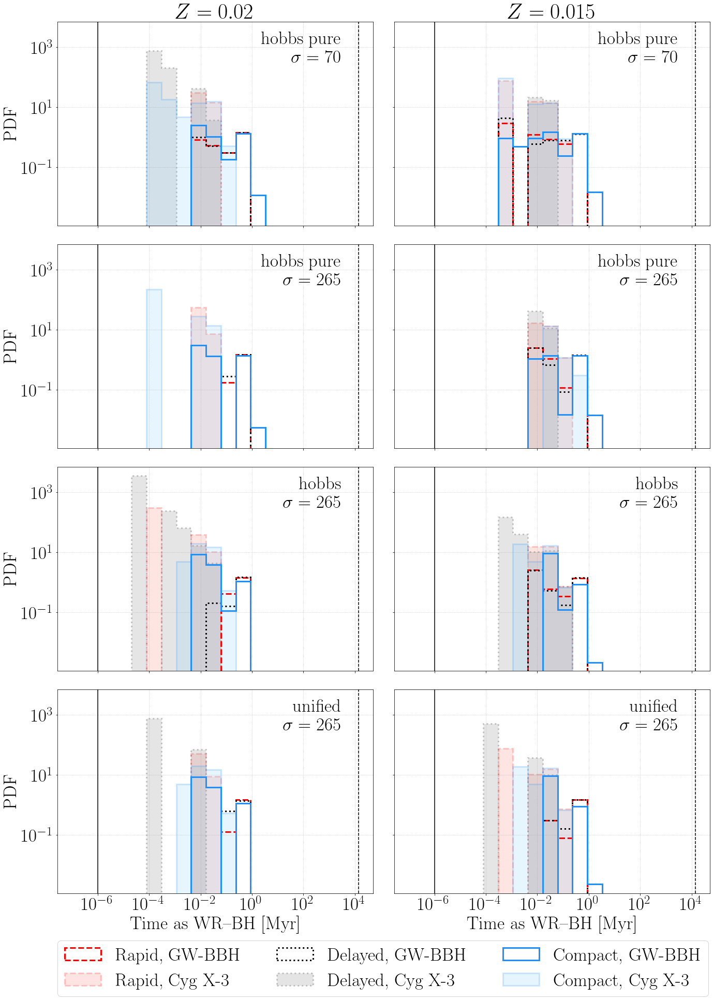

In [6]:
fig, axs = plt.subplots(nrows=len(kicklist), ncols=len(Zlist), sharex=True, sharey=True, figsize=(20,30))
bin_edges_mass=np.arange(0,151,5)       # 5 M_sun is the witdth of each bin
bin_edges_period=np.logspace(np.log10(1e-4),np.log10(1e2),20)
bin_edges_q=np.arange(0,1.01,0.01)       # 0.01 is the witdth of each bin
bin_edges_GWtime = np.logspace(np.log10(1e-7),np.log10(1e4),20)


labels=['Rapid, GW-BBH','Delayed, GW-BBH','Compact, GW-BBH']
labels2=['Rapid, Cyg X-3','Delayed, Cyg X-3','Compact, Cyg X-3']
kicklabels = [r'hobbs pure' + '\n' +r'$\sigma=70$', r'hobbs pure' + '\n' +r'$\sigma=265$',r'hobbs' + '\n' +r'$\sigma=265$',r'unified' + '\n' +r'$\sigma=265$']
colors=['r','k','dodgerblue']
colors2=['salmon','grey','lightskyblue']
linestyles=['dashed','dotted','solid']
histtypes=['step','step','step']

for Z, icol in zip(Zlist,np.arange(0,len(Zlist))):
    for kick, irow, kicklabel in zip(kicklist,np.arange(0,len(kicklist)),kicklabels):
        for SN, label, label2, color,color2,linestyle, histtype in zip(SNlist, labels, labels2, colors,colors2,linestyles, histtypes):
            path_results = f'./v_{version}/{Nsim}_Z{Z}_{SN}_{kick}/ppisn_{ppisn}'  # path to new folder with all useful results
            df = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH.csv')
            df1 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH.csv')
            
            df2 = pd.read_csv(f'{path_results}/final_WRBH/f_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')
            df3 = pd.read_csv(f'{path_results}/initial_WRBH/i_BHBH_GW_WRBH_cyg_x-3--Ko17.csv')

            axs[irow][icol].hist(df['BWorldtime']-df1['BWorldtime'], bins=bin_edges_GWtime, label=label, color=color, linestyle=linestyle, lw=3, log=True, histtype=histtype,density=True)
            axs[irow][icol].hist(df2['BWorldtime']-df3['BWorldtime'], bins=bin_edges_GWtime, label=label2, fc=color2, ec=color, linestyle=linestyle, lw=3, log=True, histtype='stepfilled', alpha=0.2,density=True)
            
        axs[irow][icol].axvline(14000, linestyle='dashed',color='k') 
        axs[irow][icol].axvline(1e-6, linestyle='solid',color='k')
        axs[irow][icol].set_xscale('log')
        axs[irow][icol].set_xticks(np.array([1e-6,1e-4,1e-2,1,100,1e4]))
        axs[irow][icol].annotate(kicklabel, (0.9,0.8),xycoords='axes fraction', color='k',ha='right')
        axs[irow][icol].grid(color='grey',alpha=0.5, linestyle='dotted')
        
#plt.suptitle(r'Primary mass distribution $M_1$ of BBH and GW-BBH')
axs[0][0].set_title(r'$Z=0.02$')
axs[0][1].set_title(r'$Z=0.015$')
axs[0][0].set_ylabel(r'PDF')
axs[1][0].set_ylabel(r'PDF')
axs[2][0].set_ylabel(r'PDF')
axs[3][0].set_ylabel(r'PDF')
axs[3][0].set_xlabel(r'Time as WR--BH [Myr]')
axs[3][1].set_xlabel(r'Time as WR--BH [Myr]')


handles, labels = axs[0][0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=3, bbox_to_anchor=(0.535,0.02))   
plt.tight_layout()
fig.subplots_adjust(bottom=0.12, top=0.9)
plt.show()
fig.savefig(f'{path_plots}CygX3-WRBHtime.pdf')